Results look bad on mo's full dataset. What gives?

### Setup

In [1]:
%load_ext autoreload
%autoreload 3 --print

In [2]:
from kpsn.project.paths import Project, create_model
from kpsn.io import loaders
from kpsn.models import joint
from kpsn import config
from kpsn.models import instantiation, setup, pose, morph, util as model_util
from kpsn import fitting
from kpsn.fitting import em
from kpsn.io import alignment, features, utils as io_utils
from kpsn.io.armature import Armature
from kpsn.fitting import methods
from kpsn.fitting import scans
from kpsn.io.dataset import PytreeDataset
from kpsn import clouds
import os, sys, shutil
from pprint import pprint
from tensorflow_probability.substrates import jax as tfp
from kpsn import viz
import numpy as np
from kpsn.viz import styles
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import scipy.stats
import os, re
from pprint import pprint
import tqdm
from matplotlib import colors as plt_colors
from matplotlib import transforms
import itertools as iit
import jax.numpy as jnp
import joblib as jl
import numpy.linalg as la
import itertools as iit
from functools import reduce
from pathlib import Path
import logging
import seaborn as sns
logging.getLogger().setLevel(logging.INFO)

In [3]:
# Define paths

data_root = Path('/Users/kaifox/projects/mph/data_explore/testsets/')

project_dir = data_root / "moont-7.24.72-distprior"
# project_dir.mkdir(exist_ok = True)
project = Project(project_dir)

plot_dir = project_dir / "plots"
plot_dir.mkdir(exist_ok = True)
plotter, colors = styles.init_nb(str(plot_dir), style = "default", fmt = 'pdf')

In [4]:
# rewrite paths to be relative to yml files
def localize_project(yml_path):
    d = config._yaml.load(open(yml_path, "r"))
    d['project'] = '../../project.yml'
    config.save_config(yml_path, d)    


def rewrite_project(project_dir):
    d = config._yaml.load(open(project_dir / "project.yml", "r"))
    d['dataset']['root_path'] = '/Users/kaifox/projects/mph/data_explore/data'
    d['calibration_file'] = './project.calib.p'
    config.save_config(project_dir / "project.yml", d)

    localize_project(project_dir / "base_model.yml")

rewrite_project(project.root())
for m in os.listdir(project.root() / "models"):
    if os.path.isdir(project.root() / "models" / m):
        localize_project(project.model_config(m))

In [5]:
def load_localized_model(path):
    ckpt = methods.load_fit(path)
    ckpt["config"] = config.load_model_config(path / "model.yml")
    return ckpt

def kde(sample, bw, resolution = 200, buffer = 5, density = False):
    x = np.linspace(sample.min() - buffer * bw, sample.max() + buffer * bw, resolution)
    gauss = lambda x, sample, bw: np.exp(-0.5 * ((sample - x) / bw)**2)
    kde = gauss(x[:, None], sample[None, :], bw).sum(axis = -1)
    if density:
        kde /= kde.sum() * (x[1] - x[0])
    return x, kde

bone_lengths = lambda keypts, armature: np.stack([
    la.norm(keypts[..., armature.bones[i, 1], :] - keypts[..., armature.bones[i, 0], :], axis = -1)
    for i in range(len(armature.bones))
], axis = -1)

In [7]:
# models = "unif-scan"
models = ['wide-prior-scan_0', 'wide-prior-scan_1', 'prior-scan_0', 'prior-scan_1', 'prior-scan_2', 'wide-prior-scan_2']

if isinstance(models, str):
    scan_cfg = config.load_config(project.scan(models) / "scan.yml")
    models = list(scan_cfg["models"].keys())
else:
    models = models

dataset, _body_inv, _, _ = scans.load_and_prepare_scan_dataset(project, model_name = models[0])

### Scan results

Plotting unif-scan_0
- reports
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_0/plots/reports.pdf


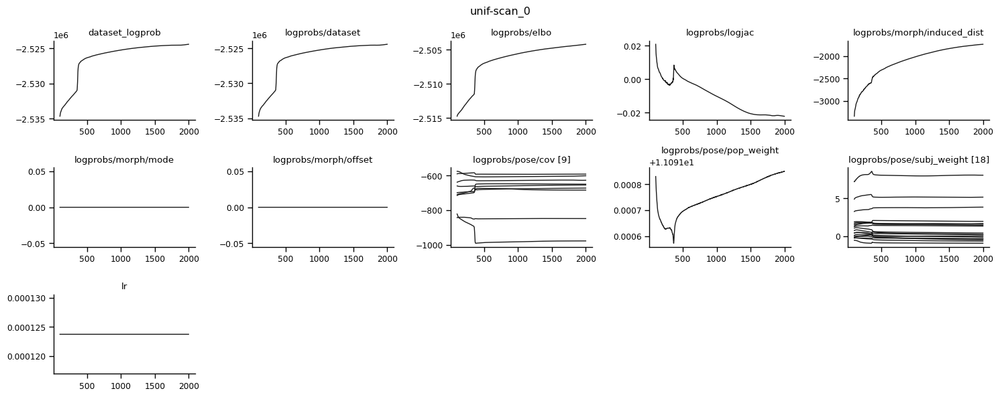

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_0/plots/em_loss.pdf


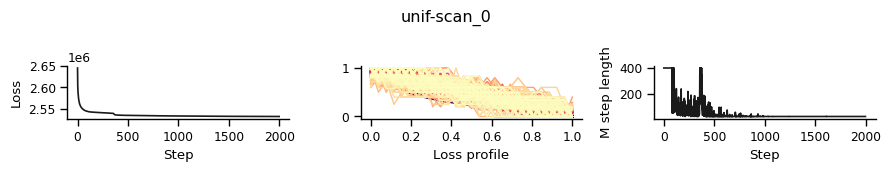

- morph


100%|██████████| 18/18 [00:02<00:00,  8.83it/s]


/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_0/plots/morph_convergence.pdf


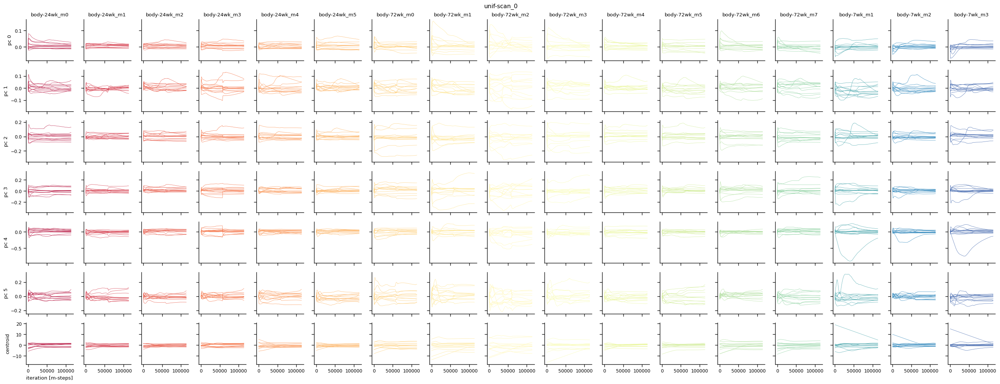

- gmm


100%|██████████| 9/9 [00:01<00:00,  5.53it/s]


/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_0/plots/gmm_convergence.pdf


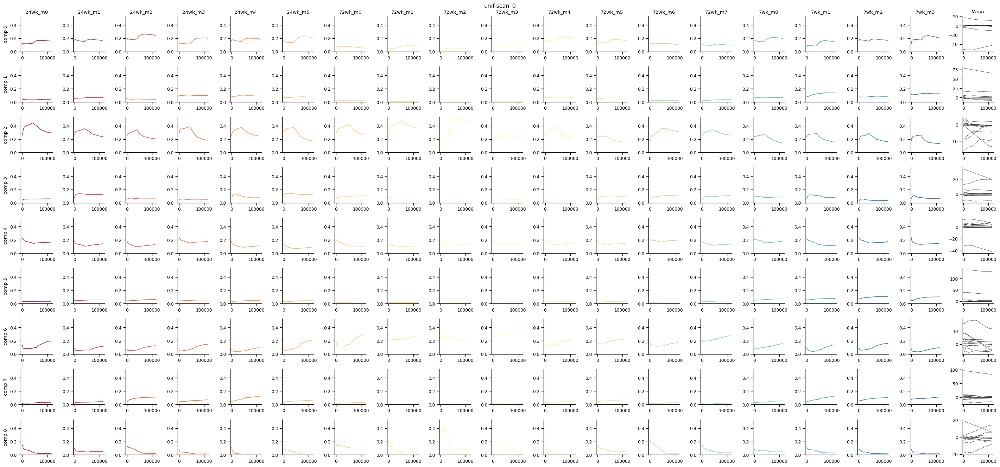

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_0/plots/gmm_means.pdf


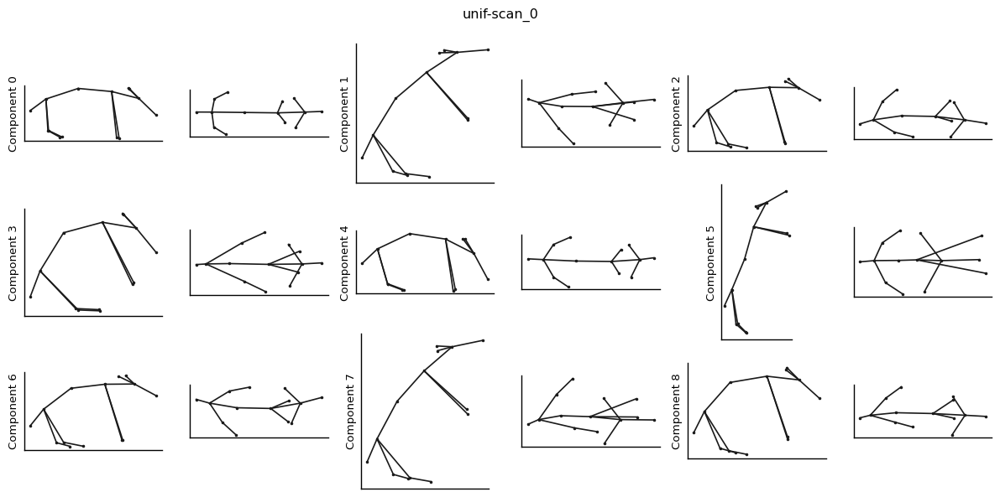

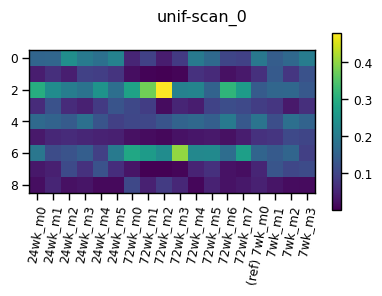

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_0/plots/gmm_weights.pdf
Plotting unif-scan_1
- reports
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_1/plots/reports.pdf


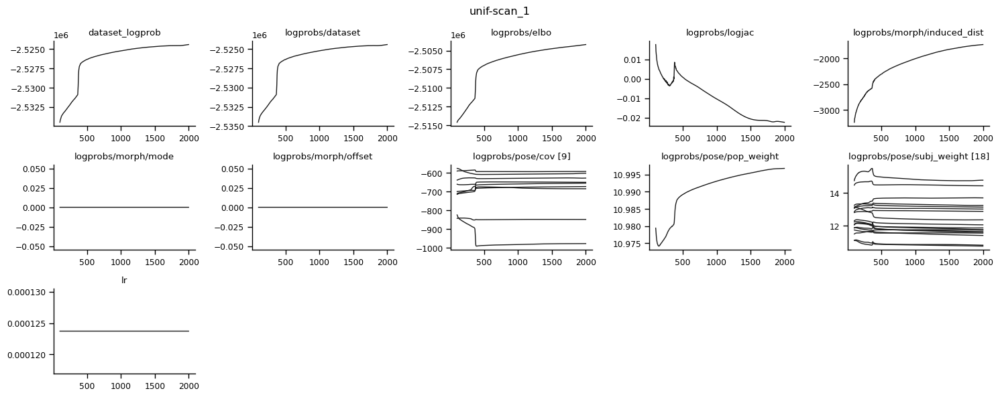

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_1/plots/em_loss.pdf


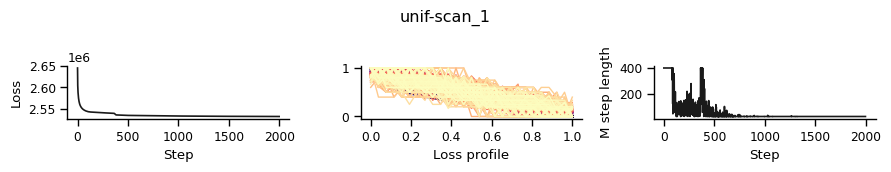

- morph


100%|██████████| 18/18 [00:02<00:00,  8.21it/s]


/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_1/plots/morph_convergence.pdf


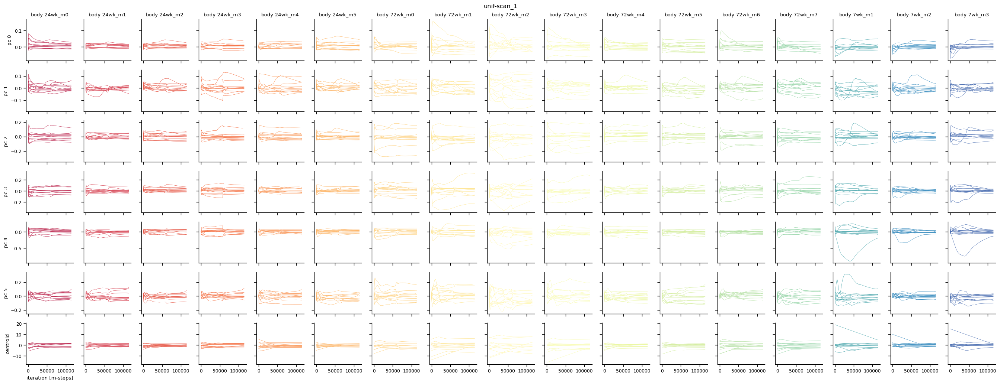

- gmm


100%|██████████| 9/9 [00:01<00:00,  5.55it/s]


/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_1/plots/gmm_convergence.pdf


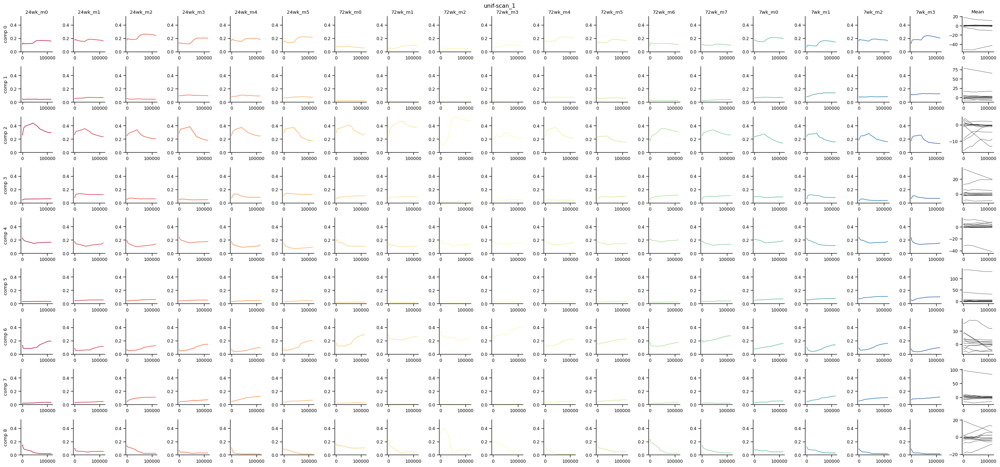

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_1/plots/gmm_means.pdf


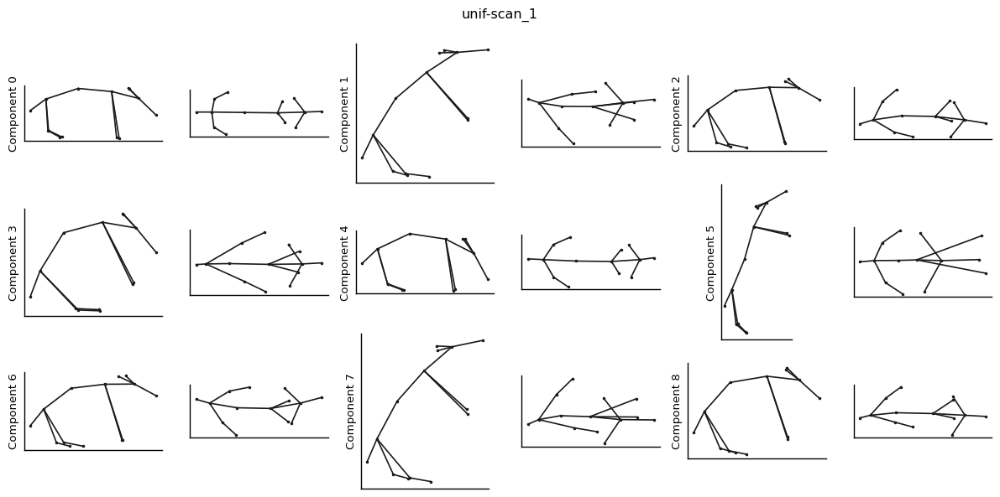

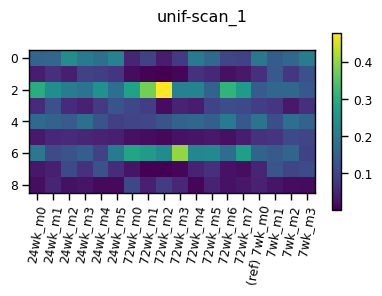

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/unif-scan_1/plots/gmm_weights.pdf


In [53]:
progress = True

for model_name in model_util._optional_pbar(models, progress):

    print("Plotting", model_name)
    ckpt = methods.load_fit(project.model(model_name))
    ckpt["config"] = config.load_model_config(project.model_config(model_name))
    (project.model(model_name) / "plots").mkdir(exist_ok = True)
    plotter.plot_dir = str(project.model(model_name) / "plots")

    print("- reports")
    fig = viz.model.report_plots(ckpt, first_step=100)
    fig.suptitle(model_name)
    plotter.finalize(fig, "reports")

    fig = viz.model.em_loss(ckpt)
    fig.suptitle(model_name)
    plotter.finalize(fig, "em_loss")

    print("- morph")
    fig = viz.model.lra_param_convergence(ckpt, progress = True)
    fig.suptitle(model_name)
    plotter.finalize(fig, "morph_convergence")

    print("- gmm")
    fig = viz.model.gmm_param_convergence(ckpt, progress = True)
    fig.suptitle(model_name)
    plotter.finalize(fig, "gmm_convergence")

    mean_fig, wt_fig = viz.model.gmm_components(ckpt)
    mean_fig.suptitle(model_name)
    wt_fig.suptitle(model_name)
    plotter.finalize(mean_fig, "gmm_means")
    plotter.finalize(wt_fig, "gmm_weights")

100%|██████████| 3/3 [00:00<00:00, 11.33it/s]


/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/scans/unif-scan/plots/reconst_errs.pdf


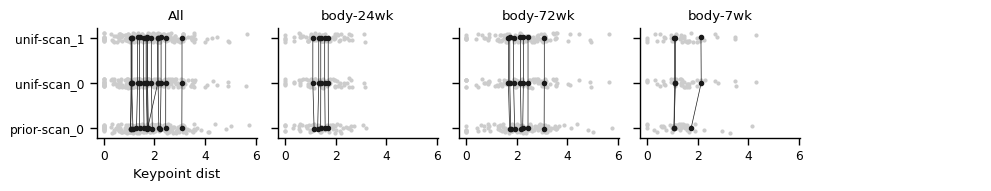

In [58]:
fig = viz.scans.withinbody_induced_errs(project, models, progress = True)
plot_dir = (project.scan('unif-scan') / "plots")
plot_dir.mkdir(exist_ok = True)
plotter.plot_dir = str(plot_dir)
plotter.finalize(fig, "reconst_errs")

Unmorphed: 100%|██████████| 3/3 [00:01<00:00,  2.21it/s]
/Users/kaifox/projects/mph/generative_api/kpsn/viz/_style.py:78: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


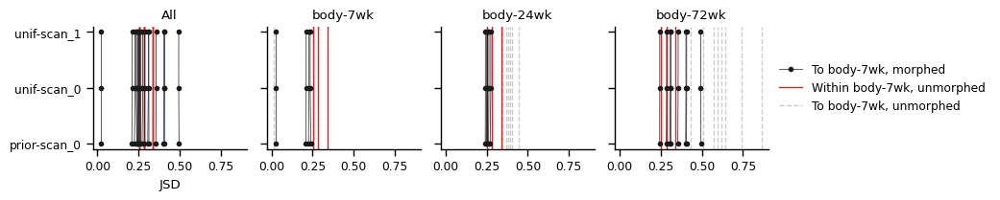

PosixPath('/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/scans/unif-scan/plots/jsds_to_reference.pdf')

In [6]:
fig = viz.scans.jsds_to_reference(project, models, progress = True)
plot_dir = (project.scan('unif-scan') / "plots")
plot_dir.mkdir(exist_ok = True)
plotter.plot_dir = str(plot_dir)
plotter.finalize(fig, "jsds_to_reference")

### What do the morphs look like?

In [246]:
# Plot morphed clip from a few bodies

start, end = 300, 500
fps=30.

for mode in ['to', 'within']:
    for model_name in ["wide-prior-scan_0", "wide-prior-scan_1", "wide-prior-scan_2"]:
    # for model_name in ["prior-scan_0", "prior-scan_1"]:
    # for model_name in ["prior-scan_2_0"]:
        model = project.model(model_name)
        (model / "plots").mkdir(exist_ok = True)
        checkpoint = methods.load_fit(model)
        checkpoint["config"] = config.load_model_config(model / "model.yml")

        output_dir = model / "plots" / "clips"
        if mode == 'within':
            output_path = output_dir / "within_{body}.mp4"
        else:
            output_path = output_dir / "to_{body}.mp4"

        params = checkpoint["params"].morph
        cfg = checkpoint["config"]
        dataset, _body_inv, _ = scans._dataset_and_bodies_inv(project, model_name, allow_subsample=False)

        for body in _body_inv:
            _inflate = lambda arr: features.inflate(arr, cfg["features"])
            armature = Armature.from_config(cfg["dataset"])

            bodies = [dataset.sess_bodies[s] for s in _body_inv[body]]
            print("Bodies: ", bodies)

            mapped_dataset, ref_keypts = viz.videos.map_clip_across_bodies(
                checkpoint,
                start,
                end,
                dataset = dataset,
            )
            mapped_tiles = viz.videos.overlay_tiles_for_bodies(
                mapped_dataset.get_session(f"s-{bodies[0]}") if mode == 'within' else ref_keypts,
                mapped_dataset,
                bodies,
                fixed_crop=False,
                subject_size=0.8,
                window_size=200,
                progress=True, 
                _inflate = _inflate,
                armature = armature,
            )
            tiled_vid = viz.videos.join_view_tiles(
                bodies,
                mapped_tiles,
                n_cols = 3,
            )

            if output_path is not None:
                viz.videos.write_video(str(output_path).format(body=body), tiled_vid, fps=fps)

Bodies:  ['body-24wk_m4', 'body-24wk_m0', 'body-24wk_m2', 'body-24wk_m5', 'body-24wk_m3', 'body-24wk_m1']


Rendering side: 100%|██████████| 6/6 [00:01<00:00,  5.12it/s]


Bodies:  ['body-7wk_m2', 'body-7wk_m1', 'body-7wk_m3', 'body-7wk_m0']


Rendering side: 100%|██████████| 4/4 [00:00<00:00,  5.72it/s]


Bodies:  ['body-72wk_m7', 'body-72wk_m6', 'body-72wk_m3', 'body-72wk_m2', 'body-72wk_m0', 'body-72wk_m1', 'body-72wk_m5', 'body-72wk_m4']


Rendering side: 100%|██████████| 8/8 [00:01<00:00,  5.84it/s]


Bodies:  ['body-24wk_m4', 'body-24wk_m0', 'body-24wk_m2', 'body-24wk_m5', 'body-24wk_m3', 'body-24wk_m1']


Rendering side: 100%|██████████| 6/6 [00:01<00:00,  5.85it/s]


Bodies:  ['body-7wk_m2', 'body-7wk_m1', 'body-7wk_m3', 'body-7wk_m0']


Rendering side: 100%|██████████| 4/4 [00:00<00:00,  5.94it/s]


Bodies:  ['body-72wk_m7', 'body-72wk_m6', 'body-72wk_m3', 'body-72wk_m2', 'body-72wk_m0', 'body-72wk_m1', 'body-72wk_m5', 'body-72wk_m4']


Rendering side: 100%|██████████| 8/8 [00:01<00:00,  5.83it/s]


Bodies:  ['body-24wk_m4', 'body-24wk_m0', 'body-24wk_m2', 'body-24wk_m5', 'body-24wk_m3', 'body-24wk_m1']


Rendering side: 100%|██████████| 6/6 [00:01<00:00,  5.41it/s]


Bodies:  ['body-7wk_m2', 'body-7wk_m1', 'body-7wk_m3', 'body-7wk_m0']


Rendering side: 100%|██████████| 4/4 [00:00<00:00,  5.73it/s]


Bodies:  ['body-72wk_m7', 'body-72wk_m6', 'body-72wk_m3', 'body-72wk_m2', 'body-72wk_m0', 'body-72wk_m1', 'body-72wk_m5', 'body-72wk_m4']


Rendering side: 100%|██████████| 8/8 [00:01<00:00,  5.72it/s]


Bodies:  ['body-24wk_m4', 'body-24wk_m0', 'body-24wk_m2', 'body-24wk_m5', 'body-24wk_m3', 'body-24wk_m1']


Rendering side: 100%|██████████| 6/6 [00:01<00:00,  5.50it/s]


Bodies:  ['body-7wk_m2', 'body-7wk_m1', 'body-7wk_m3', 'body-7wk_m0']


Rendering side: 100%|██████████| 4/4 [00:00<00:00,  5.76it/s]


Bodies:  ['body-72wk_m7', 'body-72wk_m6', 'body-72wk_m3', 'body-72wk_m2', 'body-72wk_m0', 'body-72wk_m1', 'body-72wk_m5', 'body-72wk_m4']


Rendering side: 100%|██████████| 8/8 [00:01<00:00,  5.86it/s]


Bodies:  ['body-24wk_m4', 'body-24wk_m0', 'body-24wk_m2', 'body-24wk_m5', 'body-24wk_m3', 'body-24wk_m1']


Rendering side: 100%|██████████| 6/6 [00:01<00:00,  5.54it/s]


Bodies:  ['body-7wk_m2', 'body-7wk_m1', 'body-7wk_m3', 'body-7wk_m0']


Rendering side: 100%|██████████| 4/4 [00:00<00:00,  5.50it/s]


Bodies:  ['body-72wk_m7', 'body-72wk_m6', 'body-72wk_m3', 'body-72wk_m2', 'body-72wk_m0', 'body-72wk_m1', 'body-72wk_m5', 'body-72wk_m4']


Rendering side: 100%|██████████| 8/8 [00:01<00:00,  5.86it/s]


Bodies:  ['body-24wk_m4', 'body-24wk_m0', 'body-24wk_m2', 'body-24wk_m5', 'body-24wk_m3', 'body-24wk_m1']


Rendering side: 100%|██████████| 6/6 [00:01<00:00,  5.64it/s]


Bodies:  ['body-7wk_m2', 'body-7wk_m1', 'body-7wk_m3', 'body-7wk_m0']


Rendering side: 100%|██████████| 4/4 [00:00<00:00,  5.76it/s]


Bodies:  ['body-72wk_m7', 'body-72wk_m6', 'body-72wk_m3', 'body-72wk_m2', 'body-72wk_m0', 'body-72wk_m1', 'body-72wk_m5', 'body-72wk_m4']


Rendering side: 100%|██████████| 8/8 [00:01<00:00,  5.81it/s]


In [164]:
for model_name in models:
    model = project.model(model_name)
    # (model / "plots" / "centroid_and_modes").mkdir(parents = True, exist_ok = True)
    checkpoint = methods.load_fit(model)
    # checkpoint["config"] = config.load_model_config(model / "model.yml")
    # dataset, _body_inv, _ = scans._dataset_and_bodies_inv(project, model_name)

    for body in _body_inv:
        bodies = set([dataset.sess_bodies[dataset.ref_session]] + [
            dataset.sess_bodies[s] for s in _body_inv[body]
        ])
        print(body, "bodies", bodies)
        fig = viz.model.lra_centroid_and_modes(checkpoint, body_whitelist = bodies)
        plotter.plot_dir = str(model / "plots" / "centroid_and_modes")
        plotter.finalize(fig, body, display=False)
        plt.close(fig)

body-24wk bodies {'body-24wk_m5', 'body-24wk_m2', 'body-24wk_m1', 'body-24wk_m4', 'body-24wk_m0', 'body-24wk_m3', 'body-7wk_m0'}
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/centroid_and_modes/body-24wk.pdf
body-7wk bodies {'body-7wk_m2', 'body-7wk_m1', 'body-7wk_m0', 'body-7wk_m3'}
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/centroid_and_modes/body-7wk.pdf
body-72wk bodies {'body-72wk_m2', 'body-72wk_m3', 'body-72wk_m1', 'body-72wk_m7', 'body-72wk_m0', 'body-72wk_m5', 'body-72wk_m4', 'body-72wk_m6', 'body-7wk_m0'}
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/centroid_and_modes/body-72wk.pdf
body-24wk bodies {'body-24wk_m5', 'body-24wk_m2', 'body-24wk_m1', 'body-24wk_m4', 'body-24wk_m0', 'body-24wk_m3', 'body-7wk_m0'}
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/centroid_a

In [ ]:
cfg = checkpoint["config"]
params = scans.select_param_step(
    instantiation.get_model(cfg), checkpoint["params"], checkpoint["meta"]["param_hist"], 0
)
fig = viz.model.lra_centroid_and_modes(checkpoint, body_whitelist = bodies, params = params.morph)
plotter.plot_dir = str(model / "plots")
plotter.finalize(fig, "centroid_and_modes-7wk-init")

### Comparison of morphs within / across cohort

In [165]:
induced_kpts = {}
for model_name in model_util._optional_pbar(models, progress):
    checkpoint = methods.load_fit(project.model(model_name))
    cfg = checkpoint["config"]
    model = instantiation.get_model(cfg)
    induced_kpts[model_name] = scans.induced_reference_keypoints(
        dataset,
        cfg,
        model.morph,
        checkpoint["params"].morph,
        to_body=None,  # map to all bodies
        include_reference=True,
    )

errs = {}
bodies = sorted(dataset.bodies, key=lambda b: (
    int(b.split('-')[1].split('_')[0].strip('wk')),
    int(b.split('-')[1].split('_')[1].strip('m'))
))
for model_name in models:
    kpts = induced_kpts[model_name]
    errs[model_name] = np.zeros((dataset.n_bodies, dataset.n_bodies, kpts[bodies[0]].shape[-2]))
    for i in range(len(bodies)):
        for j in range(i):
            e = model_util.reconst_errs(kpts[bodies[i]], kpts[bodies[j]])
            errs[model_name][i, j] = e
            errs[model_name][j, i] = e


100%|██████████| 3/3 [00:00<00:00, 13.25it/s]


/Users/kaifox/projects/mph/data_explore/testsets/mo-ontogeny-poseL20/models/prior-scan_0/plots/keypt_dist_grid.pdf


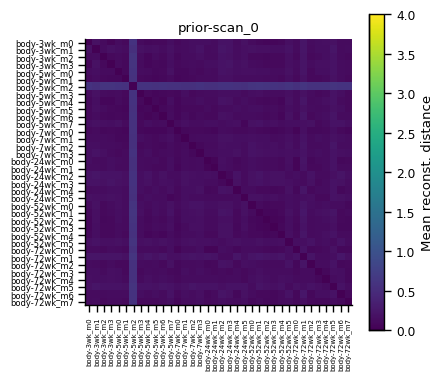

/Users/kaifox/projects/mph/data_explore/testsets/mo-ontogeny-poseL20/models/prior-scan_1/plots/keypt_dist_grid.pdf


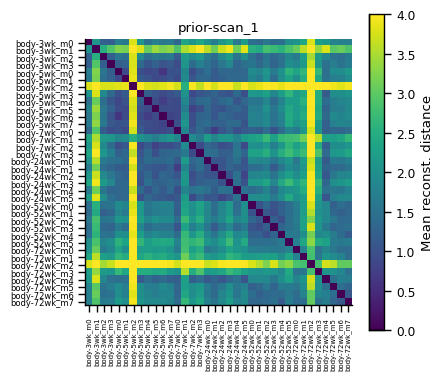

In [20]:
vmax = max([errs[model_name].mean(axis = -1).max() for model_name in models])
for model_name in models:
    fig, ax = plt.subplots(figsize = (4.5, 4))
    _ = ax.imshow(errs[model_name].mean(axis = -1), cmap = colors.cts1(as_cmap = True), vmin = 0, vmax = 4)
    ax.set_xticks(range(len(bodies)))
    ax.set_xticklabels(bodies, fontsize = 5, rotation = 90)
    ax.set_yticks(range(len(bodies)))
    ax.set_yticklabels(bodies, fontsize = 6)
    ax.set_title(model_name)
    fig.colorbar(_).ax.set_ylabel("Mean reconst. distance")
    plotter.plot_dir = str(project.model(model_name) / "plots")
    plotter.finalize(fig, "keypt_dist_grid")

### What do reconstruction error levels look like on bodies?

In [33]:
def framewise_induced_error(
    dataset,
    _body_inv,
    cfg,
    morph_model,
    params,
    ref_bodies = None
    ):
    induced_kpts = scans.induced_reference_keypoints(
        dataset,
        cfg,
        morph_model,
        params,
        to_body=None,  # map to all bodies
        include_reference=True,
    )
    # Calculate framewise keypoint error to within body reference
    errs = {}
    for b in _body_inv:
        if ref_bodies is None:
            body_ref = dataset.sess_bodies[_body_inv[b][0]]
        else:
            body_ref = ref_bodies[b]
        nonref_sessions = _body_inv[b][1:]
        nonref_bodies = [dataset.sess_bodies[s] for s in nonref_sessions]
        errs[b] = {
            s: model_util.reconst_errs(induced_kpts[b], induced_kpts[body_ref], average=False)
            for b, s in zip(nonref_bodies, nonref_sessions)
        }
    return induced_kpts, errs

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72/models/prior-scan_2_0/plots/keypoint_errors.pdf


prior-scan_2_0, low err: 100%|██████████| 15/15 [00:06<00:00,  2.31it/s]


/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72/models/prior-scan_2_0/plots/keypoint_errors_low.pdf


prior-scan_2_0, median err: 100%|██████████| 15/15 [00:06<00:00,  2.44it/s]


/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72/models/prior-scan_2_0/plots/keypoint_errors_median.pdf


prior-scan_2_0, high err: 100%|██████████| 15/15 [00:06<00:00,  2.42it/s]


/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72/models/prior-scan_2_0/plots/keypoint_errors_high.pdf


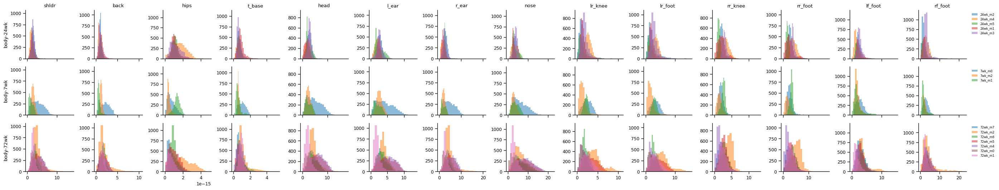

In [34]:
# Compute induced keypoints and errors to within-body reference sessions
for model_name in models:
    plotter.plot_dir = str(project.model(model_name) / "plots")

    checkpoint = methods.load_fit(project.model(model_name))
    cfg = checkpoint["config"]
    model = instantiation.get_model(cfg)
    induced_kpts, errs = framewise_induced_error(
        dataset,
        _body_inv,
        cfg,
        model.morph,
        checkpoint["params"].morph,
    )

    # plot distributions of errors
    keypt_names = checkpoint["config"]["dataset"]["use_keypoints"]
    n_keypts = len(keypt_names)
    n_bodies = len(errs)
    fig, ax = plt.subplots(n_bodies, n_keypts, figsize=(n_keypts * 2, n_bodies * 1.8), sharex = 'col', sharey = 'col')
    for i, (b, errs_) in enumerate(errs.items()):
        for s, e in errs_.items():
            for j, kp_name in enumerate(keypt_names):
                ax[i, j].hist(e[:, j], bins=20, alpha=0.5, label=s)
                ax[0, j].set_title(kp_name)
        ax[i, 0].set_ylabel(b)
        ax[i, -1].legend(frameon=False, fontsize=6, bbox_to_anchor=(1.05, 1), loc='upper left')
    plotter.finalize(fig, "keypoint_errors", display=False)

    # Plot bodies with high, median, and low error
    n_sessions = sum(len(s) - 1 for s in _body_inv.values())
    n_disp = 5
    armature = Armature.from_config(checkpoint["config"]["dataset"])
    pal = colors.cts1(n_sessions)
    for cond, quantile in [("low", 0.1), ('median', 0.5), ('high', 0.99)]:
        fig, ax = plt.subplots(n_sessions, 2 * n_disp, figsize=(n_disp * 2 * 2, n_sessions * 2), sharex = True, sharey = False)
        with tqdm.tqdm(total = n_sessions, desc = f"{model_name}, {cond} err") as pbar:
            i = 0
            for b, errs_ in errs.items():
                for (s, e) in errs_.items():
                    e = e.mean(axis=1)
                    ixs = np.argsort(e)[int(len(e) * quantile):][:n_disp]
                    kpts = induced_kpts[dataset.sess_bodies[s]]
                    ref_kpts = induced_kpts[dataset.sess_bodies[_body_inv[b][0]]]
                    for j, ix in enumerate(ixs):
                        viz.util.plot_mouse_views(ax[i, 2*j:2*(j+1)], kpts[ix],     armature, color = pal[i], zorder = 3)
                        viz.util.plot_mouse_views(ax[i, 2*j:2*(j+1)], ref_kpts[ix], armature, color = colors.subtle, zorder = -3)
                        ax[i, 2*j].set_title(f"err: {e[ix]:.4f}")
                    ax[i, 0].set_ylabel(f"{_body_inv[b][0]} -> {s}")
                    i += 1
                    pbar.update()
        plotter.finalize(fig, f"keypoint_errors_{cond}", despine = False, display=False)
        plt.close()

In [254]:
# Hypothesis: high induced errors at high values of certain modal coordinates will
# distinguish full-dataset and age-restricted models


def mode_components(
    params, poses  # MorphModelParams,  # Float[Array, "*#K M"]
):  # -> Tuple[Float[Array, "*#K L"], Float[Array, "*#K M L"], Float[Array, "*#K M-L"]]
    """
    Returns:
        components:
            Components of poses along the subspace of each morph mode.
        complement:
            Component of poses in the complement of the span of the morph
            modes.
    """
    dim_expand = (None,) * (len(poses.shape) - 1)
    modes = params.modes[dim_expand]
    coords = (poses[..., None] * modes).sum(axis=1)  # (*#K, L)
    components = coords[..., None, :] * modes  # (*#K, M L)
    complement = poses - components.sum(axis=-1)
    return coords, components, complement


# for model_name in ["prior-scan_2", "prior-scan_3", "prior-scan_0", "prior-scan_1"]:
# for model_name in ["prior-scan_2", "prior-scan_3"]:
for model_name in models:
    # (project.model(model_name) / "plots").mkdir(exist_ok = True)
    plot_dir = project.model(model_name) / "plots"

    dataset, _body_inv, _ = scans._dataset_and_bodies_inv(project, model_name)
    checkpoint = methods.load_fit(project.model(model_name))
    cfg = checkpoint["config"]
    model = instantiation.get_model(cfg)

    ref_bodies = {b: dataset.sess_bodies[dataset.ref_session] for b in _body_inv}
    induced_kpts, errs = framewise_induced_error(
        dataset,
        _body_inv,
        cfg,
        model.morph,
        checkpoint["params"].morph,
        ref_bodies=ref_bodies
    )

    ref_dataset = dataset.session_subset([dataset.ref_session])
    ref_dataset_pt = PytreeDataset.from_pythonic(ref_dataset)
    poses = model.morph.inverse_transform(
        checkpoint["params"].morph, ref_dataset_pt
    ).get_session(dataset._session_names.inverse[dataset.ref_session])
    modal_coords, _, _ = mode_components(checkpoint["params"].morph, poses)

    # Plot induced error distribtution
    fig, ax, ax_grid = viz.util.flat_grid(len(_body_inv), 3, ax_size = (2.5, 2))
    for i, b in enumerate(_body_inv):
        for (s, e) in errs[b].items():
            e = e.mean(axis=1)
            ax[i].hist(e, bins=20, alpha=0.5, label=s)
        ax[i].legend(frameon=False, fontsize=6, bbox_to_anchor=(1.05, 1), loc='upper left')
    plotter.finalize(fig, "crossgroup_error_dist", path = plot_dir)

    # Plot induced error vs. modal coordinate
    n_sessions = sum(len(s) - 1 for s in _body_inv.values())
    n_modes = modal_coords.shape[-1]
    pal = colors.cts1(n_sessions)

    fig, ax = plt.subplots(n_sessions, n_modes, figsize=(n_modes * 2, n_sessions * 1), sharex = 'col', sharey = 'row')
    with tqdm.tqdm(total = n_sessions) as pbar:
        i = 0
        for b, errs_ in errs.items():
            for (s, e) in errs_.items():
                e = e.mean(axis=1)
                for j in range(n_modes):
                    ax[i, j].plot(modal_coords[:, j], e, 'o', color = pal[i], ms = 1)
                    ax[0, j].set_title(f"mode {j}")
                ax[i, 0].set_ylabel(f"{ref_bodies[b]} \n -> \n {s}", fontsize = 6)
                i += 1
                pbar.update()
    plotter.finalize(fig, "modal_projection_error", path = plot_dir)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/kaifox/projects/mph/data_explore/testsets/moont-5.7.24.72/models/prior-scan_2_0/plots'

### Can you safely merge morphs?

In [6]:
from kpsn.models.joint import JointModelParams, JointModel
def copy_params(model: JointModel, params: JointModelParams) -> JointModelParams:
    return JointModelParams(
        model.pose.ParamClass ({k: jnp.array(a).copy() if a is not None else None for k, a in  params.pose._tree.items()}),
        model.morph.ParamClass({k: jnp.array(a).copy() if a is not None else None for k, a in params.morph._tree.items()})
    )

def param_mean(params, key, ixs, axis = 0):
    return jnp.take(params._tree[key], ixs, axis = axis).mean(axis = axis)

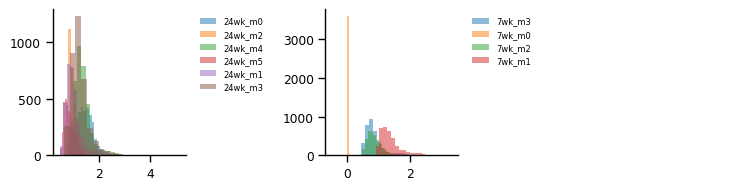

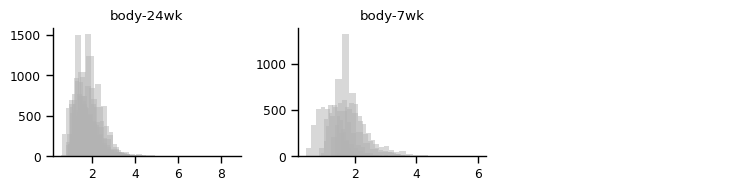

In [7]:
# Average params within each body
# Measure induced distances between these averages and the originals
# Compare to induced distances between originals

model_name = "prior-scan_2"

dataset, _body_inv, _ = scans._dataset_and_bodies_inv(project, model_name)
checkpoint = methods.load_fit(project.model(model_name))
cfg = checkpoint["config"]
model = instantiation.get_model(cfg)

# --- copy params and average parameter values according to _body_inv
new_params = copy_params(model, checkpoint["params"])
body_ixs = {b: jnp.array([dataset._body_names.inverse[dataset.sess_bodies[s]] for s in ss]) for b, ss in _body_inv.items()}
body_ixs_map = {int(ix): b for b, ixs in body_ixs.items() for ix in ixs}

new_mode_updates = {b: param_mean(new_params.morph, "_mode_updates", body_ixs[b]) for b in _body_inv}
new_ofs_updates = {b: param_mean(new_params.morph, "_offset_updates", body_ixs[b]) for b in _body_inv}
new_params.morph._tree["_mode_updates"] = jnp.stack([
    new_mode_updates[body_ixs_map[i]] for i in range(len(new_params.morph._tree["_mode_updates"]))])
new_params.morph._tree["_offset_updates"] = jnp.stack([
    new_ofs_updates[body_ixs_map[i]] for i in range(len(new_params.morph._tree["_offset_updates"]))])

# --- calculate induced keypoints for original and averaged parameters
kpts_full = scans.induced_reference_keypoints(
    dataset, cfg, model.morph, checkpoint["params"].morph, to_body=None, include_reference=True
)
kpts_avgd = scans.induced_reference_keypoints(
    dataset, cfg, model.morph, new_params.morph, to_body=None, include_reference=True
)
errs = {k: model_util.reconst_errs(kpts_full[k], kpts_avgd[k], average = False) for k in kpts_full}
_body_inv_bodies = {b: [dataset.sess_bodies[s] for s in ss] for b, ss in _body_inv.items()}
within_errs = {
    b: {(b1, b2): model_util.reconst_errs(kpts_full[b1], kpts_full[b2], average = False)
        for i, b1 in enumerate(bs) for b2 in bs[:i]}
    for b, bs in _body_inv_bodies.items()}

# --- plot differences
fig, ax, ax_grid = viz.util.flat_grid(len(_body_inv), 3, ax_size = (2.5, 2))
for i, (b, sessions) in enumerate(_body_inv.items()):
    for s in sessions:
        e = errs[dataset.sess_bodies[s]].mean(axis=1)
        ax[i].hist(e, bins=20, alpha=0.5, label=s)
    ax[i].legend(frameon=False, fontsize=6, bbox_to_anchor=(1.05, 1), loc='upper left')
plotter.finalize(fig, None)

fig, ax, ax_grid = viz.util.flat_grid(len(_body_inv), 3, ax_size = (2.5, 2))
for i, b in enumerate(within_errs):
    for _, e in within_errs[b].items():
        e = e.mean(axis = -1)
        ax[i].hist(e, bins=20, alpha=0.5, facecolor = '.7')
    ax[i].set_title(b)
plotter.finalize(fig, None)

In [8]:
jl.dump(new_params, project.model(model_name) / "averaged_params.p")

['/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24/models/prior-scan_2/averaged_params.p']

### Morph distances as a result of adding data

In [7]:
def load_localized_model(path):
    ckpt = methods.load_fit(path)
    ckpt["config"] = config.load_model_config(path / "model.yml")
    return ckpt

In [75]:

    
base_model_name = "7.24"
scnd_model_name = "5.7.24"
base_model = data_root / ("moont-" + base_model_name) / "models" / "prior-scan_2"
scnd_model = data_root / ("moont-" + scnd_model_name) / "models" / "prior-scan_2_0"

base_ckpt = load_localized_model(base_model)
scnd_ckpt = load_localized_model(scnd_model)
base_dataset, base_body_inv, _ = scans._dataset_and_bodies_inv(base_model)
scnd_dataset, scnd_body_inv, _ = scans._dataset_and_bodies_inv(scnd_model)
base_model = instantiation.get_model(base_ckpt["config"])
base_induced = scans.induced_reference_keypoints(
    base_dataset, base_ckpt["config"], base_model.morph, base_ckpt["params"].morph, to_body=None, include_reference=True
)
scnd_induced = scans.induced_reference_keypoints(
    scnd_dataset, scnd_ckpt["config"], base_model.morph, scnd_ckpt["params"].morph, to_body=None, include_reference=True
)
ref_body = base_dataset.sess_bodies[base_dataset.ref_session]
base_errs = {k: model_util.reconst_errs(base_induced[k], base_induced[ref_body], average = False) for k in base_induced}
scnd_errs = {k: model_util.reconst_errs(scnd_induced[k], scnd_induced[ref_body], average = False) for k in base_induced}

_body_inv_bodies = {b: [dataset.sess_bodies[s] for s in ss] for b, ss in base_body_inv.items()}
base_within_errs = {
    b: {(b1, b2): model_util.reconst_errs(base_induced[b1], base_induced[b2], average = False)
        for i, b1 in enumerate(bs) for b2 in bs[:i]}
    for b, bs in _body_inv_bodies.items()}
scnd_within_errs = {
    b: {(b1, b2): model_util.reconst_errs(scnd_induced[b1], scnd_induced[b2], average = False)
        for i, b1 in enumerate(bs) for b2 in bs[:i]}
    for b, bs in _body_inv_bodies.items()}

../plots/moont-full/crossbody_7.24_5.7.24.pdf


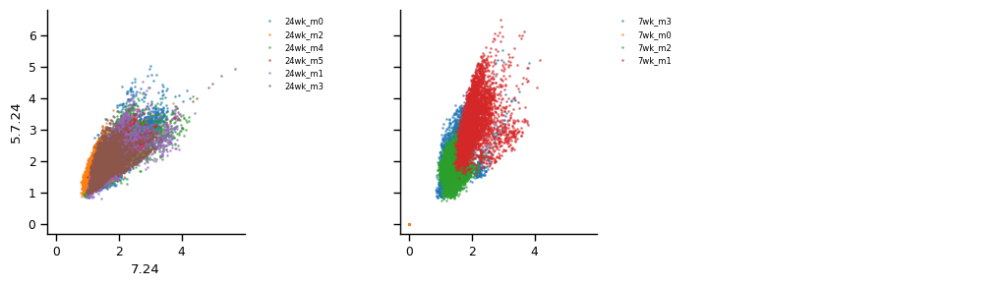

In [76]:
fig, ax, ax_grid = viz.util.flat_grid(len(base_body_inv), 3, ax_size = (3.5, 3), sharex = True, sharey = True)
for i, (b, sessions) in enumerate(base_body_inv.items()):
    for s in sessions:
        base_e = base_errs[base_dataset.sess_bodies[s]].mean(axis=1)
        scnd_e = scnd_errs[base_dataset.sess_bodies[s]].mean(axis=1)
        ax[i].plot(base_e, scnd_e, 'o', label = s, ms = 1, alpha = 0.5)
    ax[i].set_aspect(1.)
    ax[i].legend(frameon=False, fontsize=6, bbox_to_anchor=(1.05, 1), loc='upper left')
ax_grid[0, 0].set_ylabel(f"{scnd_model_name}")
ax_grid[-1, 0].set_xlabel(f"{base_model_name}")
plotter.plot_dir = '../plots/moont-full'
plotter.finalize(fig,  f"crossbody_{base_model_name}_{scnd_model_name}")

../plots/moont-full/withinbody_7.24_5.7.24.pdf


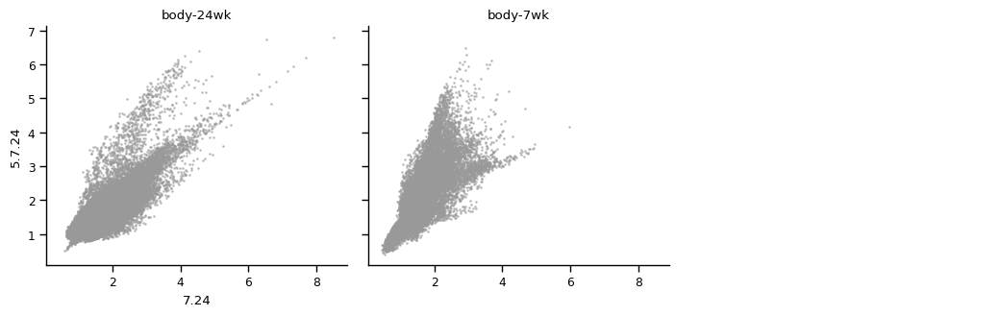

In [77]:
fig, ax, ax_grid = viz.util.flat_grid(len(base_body_inv), 3, ax_size = (3.5, 3), sharex = True, sharey = True)
for i, b in enumerate(base_body_inv):
    for pair in base_within_errs[b]:
        base_e = base_within_errs[b][pair].mean(axis=1)
        scnd_e = scnd_within_errs[b][pair].mean(axis=1)
        ax[i].plot(base_e, scnd_e, 'o', ms = 1, alpha = 0.5, color = '.6')
    ax[i].set_aspect(1.)
    ax[i].set_title(b)
ax_grid[0, 0].set_ylabel(f"{scnd_model_name}")
ax_grid[-1, 0].set_xlabel(f"{base_model_name}")
plotter.plot_dir = '../plots/moont-full'
plotter.finalize(fig, f"withinbody_{base_model_name}_{scnd_model_name}")

### Bone length distributions

In [ ]:
# for each bone: original distributions (reference highlighted), distribution after morph onto reference body

In [166]:
def kde(sample, bw, resolution = 200):
    x = np.linspace(sample.min(), sample.max(), resolution)
    gauss = lambda x, sample, bw: np.exp(-0.5 * ((sample - x) / bw)**2)
    kde = gauss(x[:, None], sample[None, :], bw).sum(axis = -1)
    return x, kde

# sample = np.linspace(0, 1, 1000)
# fig, ax = plt.subplots(1, 1, figsize = (3, 3))
# ax.plot(*kde(sample, bw = 0.01), label = "original")
# plotter.finalize(fig, None)

In [167]:
# sys.path.append("/Users/kaifox/projects")
# from mph.generative.kpsn.util import skeleton
bone_lengths = lambda keypts, armature: np.stack([
    la.norm(keypts[..., armature.bones[i, 1], :] - keypts[..., armature.bones[i, 0], :], axis = -1)
    for i in range(len(armature.bones))
], axis = -1)

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/bl_distributions.pdf


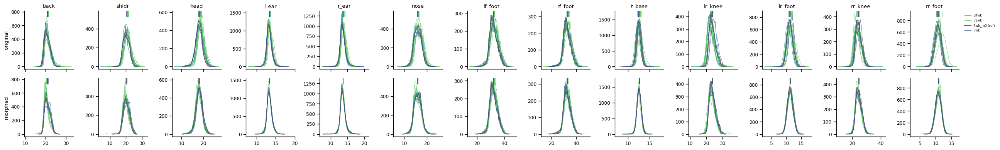

['/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/bl_distributions.p']
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/bl_distributions.pdf


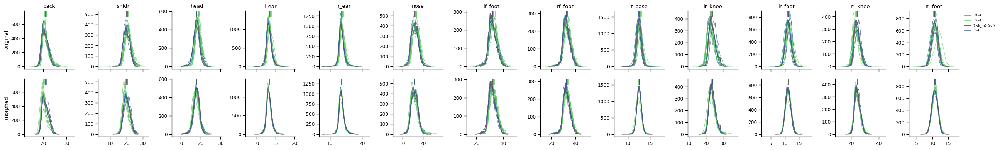

['/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/bl_distributions.p']
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/bl_distributions.pdf


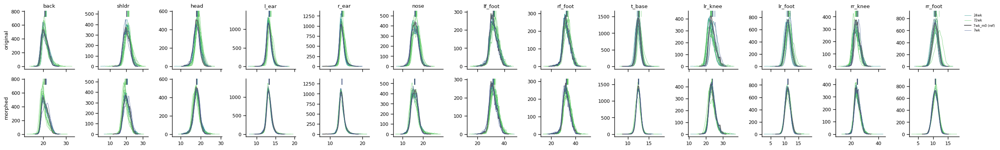

['/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/bl_distributions.p']


In [47]:
for model_name in models:
    plot_dir = project.model(model_name) / "plots"
    checkpoint = load_localized_model(project.model(model_name))
    model = instantiation.get_model(checkpoint["config"])
    armature = Armature.from_config(checkpoint["config"]["dataset"])
    _inflate = lambda arr: features.inflate(arr, checkpoint["config"]["features"])
    inflated = _inflate(dataset)
    bl_orig = {s: bone_lengths(inflated.get_session(s), armature) for s in dataset.sessions}

    # transform all bodies to the reference body
    params = checkpoint["params"].morph
    # params = jl.load(project.model(model_name) / "averaged_params.p").morph
    mapped = model_util.apply_bodies(
        model.morph,
        params,
        dataset,
        {s: dataset.sess_bodies[dataset.ref_session] for s in dataset.sessions},
    )
    mapped_inflated = _inflate(mapped)
    bl_mapped = {s: bone_lengths(mapped_inflated.get_session(s), armature) for s in dataset.sessions}

    bone_names = [armature.keypoint_names[int(ix)] for ix in armature.bones[:, 0]] # name by child keypt
    ages = {s: int(s.split('_')[0].strip('wk')) for s in dataset.sessions}
    age_pal = dict(zip(sorted(set(ages.values())), colors.cts1(len(set(ages.values())))))

    fig, ax = plt.subplots(2, len(bone_names), figsize = (2 * len(bone_names), 2 * 2), sharex = 'col', sharey = 'col')
    for i_bone, bone_name in enumerate(bone_names):
        for s in dataset.sessions:
            kws = dict(
                color = '.4' if s == dataset.ref_session else age_pal[ages[s]],
                label = f"{s} (ref)" if s == dataset.ref_session else f"{ages[s]}wk",
                lw = 1.5 if s == dataset.ref_session else 0.5
            )
            ax[0, i_bone].plot(*kde(bl_orig  [s][:, i_bone], bw = 0.2), **kws)
            ax[1, i_bone].plot(*kde(bl_mapped[s][:, i_bone], bw = 0.2), **kws)
            ax[0, i_bone].axvline(bl_orig  [s][:, i_bone].mean(), ymin = 0.9, **kws)
            ax[1, i_bone].axvline(bl_mapped[s][:, i_bone].mean(), ymin = 0.9, **kws)
        ax[0, i_bone].set_title(bone_name)
    ax[0, 0].set_ylabel("original")
    ax[1, 0].set_ylabel("morphed")
    ax[0, -1].legend(*viz.util.unique_handles(ax[0, -1]), frameon = False, fontsize = 6, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    plotter.finalize(fig, "bl_distributions", path = plot_dir)

    fig, ax, ax_grid = viz.util.flat_grid(len(bone_names), 5, ax_size = (2, 2), sharex = True, sharey = False)
    for i_bone, bone_name in enumerate(bone_names):
        body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
        for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
            sessions = _body_inv[body]
            nonref_sessions = [s for s in sessions if s != dataset.ref_session]
            ref_sessions = [s for s in sessions if s == dataset.ref_session]
            for is_ref, sess_list in enumerate([nonref_sessions, ref_sessions]):
                xs, strips = viz.util.multi_stripplot(
                    [[np.array([bls[s][:, i_bone].mean() for s in sess_list]) for bls in [bl_orig, bl_mapped]],
                     [np.array([bls[s][:, i_bone].std()  for s in sess_list]) for bls in [bl_orig, bl_mapped]]],
                    x = np.array([0., 1]) + (i_body - (len(_body_inv)-1) / 2) * min(0.2, 0.8 / len(_body_inv)),
                    jitter = (1-is_ref) * 0.05,
                )
                kws = dict(
                    label = f"{body_age}wk (ref)" if is_ref and len(ref_sessions) else f"{body_age}wk",
                    color = '.4' if is_ref else age_pal[int(body_age)],
                    elinewidth = 1 if is_ref else 0.5,
                )
                ax[i_bone].errorbar(xs, strips[0], yerr = strips[1], fmt = 'o', ms = 4, **kws)
        ax[i_bone].set_title(bone_name)
        ax[i_bone].set_xticks([0, 1])
        ax[i_bone].set_xticklabels(["original", "morphed"])
        ax[i_bone].set_xlim(-0.5, 1.5)
    ax_grid[0, -1].legend(*viz.util.unique_handles(ax[0]), frameon = False, fontsize = 6, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    plotter.finalize(fig, "bl-mean-stds", path = plot_dir)

    print(
        jl.dump(dict(original = bl_orig, morphed = bl_mapped, bone_names = bone_names),
        project.model(model_name) / "bl_distributions.p")
    )

In [1]:
# bone length distributions within GMM cluster
# one way to say that the remaining bone length differences between ages makes
# sense given the model is if the cohort differences disappear within pose
# cluster

for model_name in models:
    plot_dir = project.model(model_name) / "plots"
    
    checkpoint = load_localized_model(project.model(model_name))
    model = instantiation.get_model(checkpoint["config"])
    armature = Armature.from_config(checkpoint["config"]["dataset"])
    _inflate = lambda arr: features.inflate(arr, checkpoint["config"]["features"])
    inflated = _inflate(dataset)
    bl_orig = {s: bone_lengths(inflated.get_session(s), armature) for s in dataset.sessions}

    # transform all bodies to the reference body
    params = checkpoint["params"].morph
    # params = jl.load(project.model(model_name) / "averaged_params.p").morph
    mapped = model_util.apply_bodies(
        model.morph,
        params,
        dataset,
        {s: dataset.sess_bodies[dataset.ref_session] for s in dataset.sessions},
    )
    mapped_inflated = _inflate(mapped)
    bl_mapped = {s: bone_lengths(mapped_inflated.get_session(s), armature) for s in dataset.sessions}

    # note: because reference session has identity morph, mapped also contains
    # pose space data
    component_probs = model.pose.pose_logprob(checkpoint["params"].pose, mapped)
    components = {s: component_probs[mapped.get_slice(s)].argmax(axis=-1) for s in mapped.sessions}
    n_comps = checkpoint["params"].pose.n_components

    bone_names = [armature.keypoint_names[int(ix)] for ix in armature.bones[:, 0]] # name by child keypt
    ages = {s: int(s.split('_')[0].strip('wk')) for s in dataset.sessions}
    age_pal = dict(zip(sorted(set(ages.values())), colors.cts1(len(set(ages.values())))))

    fig, ax, ax_grid = viz.util.flat_grid(len(bone_names), 5, ax_size = (2.5, 1.7), sharex = True, sharey = False)
    for i_bone, bone_name in enumerate(bone_names):
        body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
        for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
            sessions = _body_inv[body]
            nonref_sessions = [s for s in sessions if s != dataset.ref_session]
            ref_sessions = [s for s in sessions if s == dataset.ref_session]
            for is_ref, sess_list in enumerate([nonref_sessions, ref_sessions]):
                xs, strips = viz.util.multi_stripplot(
                    [[np.array([bl_mapped[s][components[s] == i, i_bone].mean() for s in sess_list]) for i in range(n_comps)] + 
                     [np.array([bls[s][:, i_bone].mean() for s in sess_list]) for bls in [bl_orig, bl_mapped]],
                     [np.array([bl_mapped[s][components[s] == i, i_bone].std()  for s in sess_list]) for i in range(n_comps)] + 
                     [np.array([bls[s][:, i_bone].std() for s in sess_list]) for bls in [bl_orig, bl_mapped]]
                     ],
                    x = np.arange(n_comps + 2) + (i_body - (len(_body_inv)-1) / 2) * min(0.25, 0.8 / len(_body_inv)),
                    jitter = (1-is_ref) * 0.05,
                )
                kws = dict(
                    label = f"{body_age}wk (ref)" if is_ref and len(ref_sessions) else f"{body_age}wk",
                    color = '.4' if is_ref else age_pal[int(body_age)],
                    elinewidth = 0.5 if is_ref else 0.5,
                )
                ax[i_bone].errorbar(xs, strips[0], yerr = strips[1], fmt = 'o', ms = 2, **kws)
        ax[i_bone].set_title(bone_name)
        ax[i_bone].axvline(n_comps - 0.5, color = '.4', ls = '--', lw = 0.5)
        ax[i_bone].set_xticks(np.arange(n_comps + 2))
        ax[i_bone].set_xticklabels(list(range(n_comps)) + ["orig", "morph"], rotation = 90, fontsize = 8)
        # ax[i_bone].set_xlim(-0.7, n_comps - .5)
    ax_grid[0, -1].legend(*viz.util.unique_handles(ax[0]), frameon = False, fontsize = 6, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    ax_grid[-1, 0].set_xlabel("Component")
    plotter.finalize(fig, "component_bl_means", path = plot_dir)

    break

NameError: name 'models' is not defined

In [50]:
body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
body_order = sorted(body_ages, key=lambda k: body_ages[k])
body_labels = {b: f"{body_ages[b]}wk" for b in body_order}
body_pal = dict(zip(body_order, colors.cts1(len(body_order))))

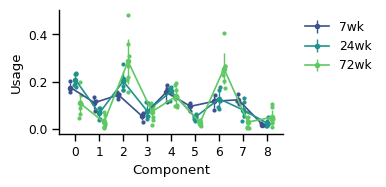

In [52]:
for model_name in models:
    plot_dir = project.model(model_name) / "plots"
    checkpoint = load_localized_model(project.model(model_name))
    n_comp = checkpoint["params"].pose.n_components

    ref_name = dataset.session_name(dataset.ref_session)
    stripdata = {
        body: [
            np.array([
                checkpoint["params"].pose.subj_weights[dataset.session_id(s), i_c]
                for s in _body_inv[body] if s != ref_name
            ])
            for i_c in range(n_comp)
        ]
        for body in body_order
    }

    fig, ax = plt.subplots(1, 1, figsize = (4, 2))
    viz.util.grouped_stripplot(
        stripdata,
        ax = ax,
        colors = body_pal,
        labels = body_labels,
        errorbar_kw = {'fmt': '-o'}
    )
    
    ax.set_ylabel("Usage")
    ax.set_xlabel("Component")
    
    plotter.finalize(fig, 'gmm_weights_lineplot', path = plot_dir, save = False)

In [27]:
checkpoint = load_localized_model(project.model(models[0]))
armature = Armature.from_config(checkpoint["config"]["dataset"])
keypt_parent = lambda ix: armature.bones[armature.bones[:, 0] == ix, 1][0]
has_parent = lambda ix: np.any(armature.bones[:, 0] == ix)
bone_ix = lambda keypt_ix: np.where(armature.bones[:, 0] == keypt_ix)[0][0]
joints = np.array([(child, parent, keypt_parent(parent)) for child, parent in armature.bones if has_parent(parent)])
cos = lambda a, b: np.clip((a * b).sum(axis = -1) / (la.norm(a, axis = -1) * la.norm(b, axis = -1)), -1, 1)
calc_joint_angles = lambda kpts: np.array([180 - np.arccos(np.clip(cos(
        kpts[:, c, :] - kpts[:, p, :],
        kpts[:, g, :] - kpts[:, p, :]
    ), -1, 1)) for c, p, g in joints]).T

In [31]:
for model_name in models:
    plot_dir = project.model(model_name) / "plots"
    checkpoint = load_localized_model(project.model(model_name))
    model = instantiation.get_model(checkpoint["config"])
    armature = Armature.from_config(checkpoint["config"]["dataset"])
    _inflate = lambda arr: features.inflate(arr, checkpoint["config"]["features"])
    inflated = _inflate(dataset)


    # transform all bodies to the reference body
    params = checkpoint["params"].morph
    # params = jl.load(project.model(model_name) / "averaged_params.p").morph
    mapped = model_util.apply_bodies(
        model.morph,
        params,
        dataset,
        {s: dataset.sess_bodies[dataset.ref_session] for s in dataset.sessions},
    )
    mapped_inflated = _inflate(mapped)

    ja_orig = {s: calc_joint_angles(inflated.get_session(s)) for s in dataset.sessions}
    ja_mapd = {s: calc_joint_angles(mapped_inflated.get_session(s)) for s in dataset.sessions}

    component_probs = model.pose.pose_logprob(checkpoint["params"].pose, mapped)
    components = {s: component_probs[mapped.get_slice(s)].argmax(axis=-1) for s in mapped.sessions}
    n_comps = checkpoint["params"].pose.n_components


    joint_names = [f"{armature.keypoint_names[int(c)]}" for c, p, g in joints]
    ages = {s: int(s.split('_')[0].strip('wk')) for s in dataset.sessions}
    age_pal = dict(zip(sorted(set(ages.values())), colors.cts1(len(set(ages.values())))))

    fig, ax = plt.subplots(2, len(joint_names), figsize = (2 * len(joint_names), 2 * 2), sharex = 'col', sharey = 'col')
    for i_joint, j_name in enumerate(joint_names):
        for s in dataset.sessions:
            kws = dict(
                color = '.4' if s == dataset.ref_session else age_pal[ages[s]],
                label = f"{s} (ref)" if s == dataset.ref_session else f"{ages[s]}wk",
                lw = 1.5 if s == dataset.ref_session else 0.5
            )
            ax[0, i_joint].plot(*kde(ja_orig[s][:, i_joint], bw = 0.01), **kws)
            ax[1, i_joint].plot(*kde(ja_mapd[s][:, i_joint], bw = 0.01), **kws)
            ax[0, i_joint].axvline(ja_orig[s][:, i_joint].mean(), ymin = 0.9, **kws)
            ax[1, i_joint].axvline(ja_mapd[s][:, i_joint].mean(), ymin = 0.9, **kws)
        ax[0, i_joint].set_title(j_name)
    ax[0, 0].set_ylabel("original")
    ax[1, 0].set_ylabel("morphed")
    ax[0, -1].legend(*viz.util.unique_handles(ax[0, -1]), frameon = False, fontsize = 6, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    plotter.finalize(fig, "ja_distributions", path = plot_dir)

    fig, ax, ax_grid = viz.util.flat_grid(len(joint_names), 5, ax_size = (2, 2), sharex = True, sharey = False)
    for i_joint, j_name in enumerate(joint_names):
        body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
        for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
            sessions = _body_inv[body]
            nonref_sessions = [s for s in sessions if s != dataset.ref_session]
            ref_sessions = [s for s in sessions if s == dataset.ref_session]
            for is_ref, sess_list in enumerate([nonref_sessions, ref_sessions]):
                xs, strips = viz.util.multi_stripplot(
                    [[np.array([bls[s][:, i_joint].mean() for s in sess_list]) for bls in [ja_orig, ja_mapd]],
                     [np.array([bls[s][:, i_joint].std()  for s in sess_list]) for bls in [ja_orig, ja_mapd]]],
                    x = np.array([0., 1]) + (i_body - (len(_body_inv)-1) / 2) * min(0.2, 0.8 / len(_body_inv)),
                    jitter = (1-is_ref) * 0.05,
                )
                kws = dict(
                    label = f"{body_age}wk (ref)" if is_ref and len(ref_sessions) else f"{body_age}wk",
                    color = '.4' if is_ref else age_pal[int(body_age)],
                    elinewidth = 1 if is_ref else 0.5,
                )
                ax[i_joint].errorbar(xs, strips[0], yerr = strips[1], fmt = 'o', ms = 4, **kws)
        ax[i_joint].set_title(j_name)
        ax[i_joint].set_xticks([0, 1])
        ax[i_joint].set_xticklabels(["original", "morphed"])
        ax[i_joint].set_xlim(-0.5, 1.5)
    ax_grid[0, -1].legend(*viz.util.unique_handles(ax[0]), frameon = False, fontsize = 6, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    plotter.finalize(fig, "ja-mean-stds", path = plot_dir)

    fig, ax, ax_grid = viz.util.flat_grid(len(joint_names), 3, ax_size = (0.09 * len(_body_inv) * (n_comps+2), 1.7), sharex = True, sharey = False)
    for i_joint, j_name in enumerate(joint_names):
        body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
        for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
            sessions = _body_inv[body]
            nonref_sessions = [s for s in sessions if s != dataset.ref_session]
            ref_sessions = [s for s in sessions if s == dataset.ref_session]
            for is_ref, sess_list in enumerate([nonref_sessions, ref_sessions]):
                xs, strips = viz.util.multi_stripplot(
                    [[np.array([ja_mapd[s][components[s] == i, i_joint].mean() for s in sess_list]) for i in range(n_comps)] + 
                        [np.array([bls[s][:, i_joint].mean() for s in sess_list]) for bls in [ja_orig, ja_mapd]],
                        [np.array([ja_mapd[s][components[s] == i, i_joint].std()  for s in sess_list]) for i in range(n_comps)] + 
                        [np.array([bls[s][:, i_joint].std() for s in sess_list]) for bls in [ja_orig, ja_mapd]]
                        ],
                    x = np.arange(n_comps + 2) + (i_body - (len(_body_inv)-1) / 2) * min(0.25, 0.8 / len(_body_inv)),
                    jitter = (1-is_ref) * 0.05,
                )
                kws = dict(
                    label = f"{body_age}wk (ref)" if is_ref and len(ref_sessions) else f"{body_age}wk",
                    color = '.4' if is_ref else age_pal[int(body_age)],
                    elinewidth = 0.5 if is_ref else 0.5,
                )
                ax[i_joint].errorbar(xs, strips[0], yerr = strips[1], fmt = 'o', ms = 2, **kws)
        ax[i_joint].set_title(j_name)
        ax[i_joint].axvline(n_comps - 0.5, color = '.4', ls = '--', lw = 0.5)
        ax[i_joint].set_xticks(np.arange(n_comps + 2))
        ax[i_joint].set_xticklabels(list(range(n_comps)) + ["orig", "morph"], rotation = 90, fontsize = 9)
        # ax[i_joint].set_xlim(-0.7, n_comps - .5)
    ax_grid[0, -1].legend(*viz.util.unique_handles(ax[0]), frameon = False, fontsize = 6, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    ax_grid[-1, 0].set_xlabel("Component")
    plotter.finalize(fig, "component_ja_means", path = plot_dir)

    fig, ax = plt.subplots(1, 1, figsize = (6, 3))
    body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
    for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
        ofs = (i_body - (len(body_ages)-1) / 2) * min(0.2, 0.8 / len(body_ages))
        
        x, usage_strip, (mean_x, mean_strip), (_, std_strip) = viz.util.stripplot(
            *[np.array([
                scipy.stats.pearsonr(ja_orig[s][:, i_joint], ja_mapd[s][:, i_joint]).statistic
            for s in _body_inv[body] if s != dataset.ref_session])
            for i_joint in range(len(joint_names))
            ],
            x = np.arange(len(joint_names)),
            apply = (np.mean, np.std),
            jitter = 0.05
        )
        ax.plot(x + ofs, usage_strip, 'o', ms = 2, color = age_pal[body_age])
        ax.errorbar(mean_x + ofs, mean_strip, yerr = std_strip, fmt = '-o', label = f"{body_age}wk", ms = 5, color = age_pal[body_age])
    ax.set_ylabel("Joint angle correlation")
    ax.set_ylim(-0.05, 1.05)
    for i in range(len(joint_names)):
        ax.axvline(i, color = colors.subtle, ls = '--', lw = 0.5, alpha = 0.7, zorder  = -3)
    ax.legend(frameon = False, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    ax.set_xticks(np.arange(len(joint_names)))
    ax.set_xticklabels(joint_names, rotation = 90)
    plotter.finalize(fig, "ja-correlations", path = plot_dir)

    print(
        jl.dump(dict(original = ja_orig, morphed = ja_mapd, joint_names = joint_names),
        project.model(model_name) / "ja_distributions.p")
    )


['/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/ja_distributions.p']
['/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/ja_distributions.p']
['/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/ja_distributions.p']


In [ ]:
body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
body_order = sorted(body_ages, key=lambda k: body_ages[k])
body_labels = {b: f"{body_ages[b]}wk" for b in body_order}
body_pal = dict(zip(body_order, colors.cts1(len(body_order))))

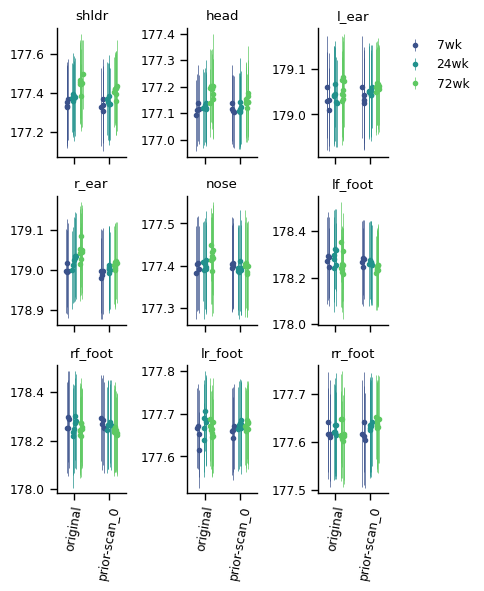

In [59]:
jas_orig, jas_mapd = {m: {} for m in models}, {m: {} for m in models}
for model_name in models:
    jas = jl.load(project.model(model_name) / "ja_distributions.p")
    jas_orig[model_name] = jas["original"]
    jas_mapd[model_name] = jas["morphed"]
all_model_jas = [jas_orig[models[0]]] + [jas_mapd[m] for m in models]

checkpoint = load_localized_model(project.model(models[0]))
model = instantiation.get_model(checkpoint["config"])

ax_size_x = max(1.5, 0.1 * (len(models) + 1) * len(_body_inv) + 0.35 * 3)
fig, ax, ax_grid = viz.util.flat_grid(len(joint_names), 3, ax_size = (ax_size_x, 2), sharex = True, sharey = False)
for i_joint, j_name in enumerate(joint_names):
    
    stripdata = {
        body: [[a[s][:, i_joint] for s in _body_inv[body]] for a in all_model_jas]
        for body in body_order
    }
    
    viz.util.grouped_errorbar_strips(
        stripdata,
        ax = ax[i_joint],
        colors = body_pal,
        labels = body_labels if i_joint == 2 else None,
        xticks = ["original"] + models,
        errorbar_kw = {'elinewidth': 0.5},
        xtick_kw = {'rotation': 80}
    )
    
    ax[i_joint].set_title(j_name)
    # ax[i_joint].set_xticks(range(len(models) + 1))
    # ax[i_joint].set_xticklabels(["original"] + models, rotation = 80)
    ax[i_joint].set_xlim(-0.5, len(models) + 0.5)
    
# ax_grid[0, -1].legend(*viz.util.unique_handles(ax[0]), frameon = False, fontsize = 6, bbox_to_anchor = (1.05, 1), loc = 'upper left')
plot_dir = project.root() / "plots"
plotter.finalize(fig, "convergence_ja-mean", path = plot_dir, save = False)

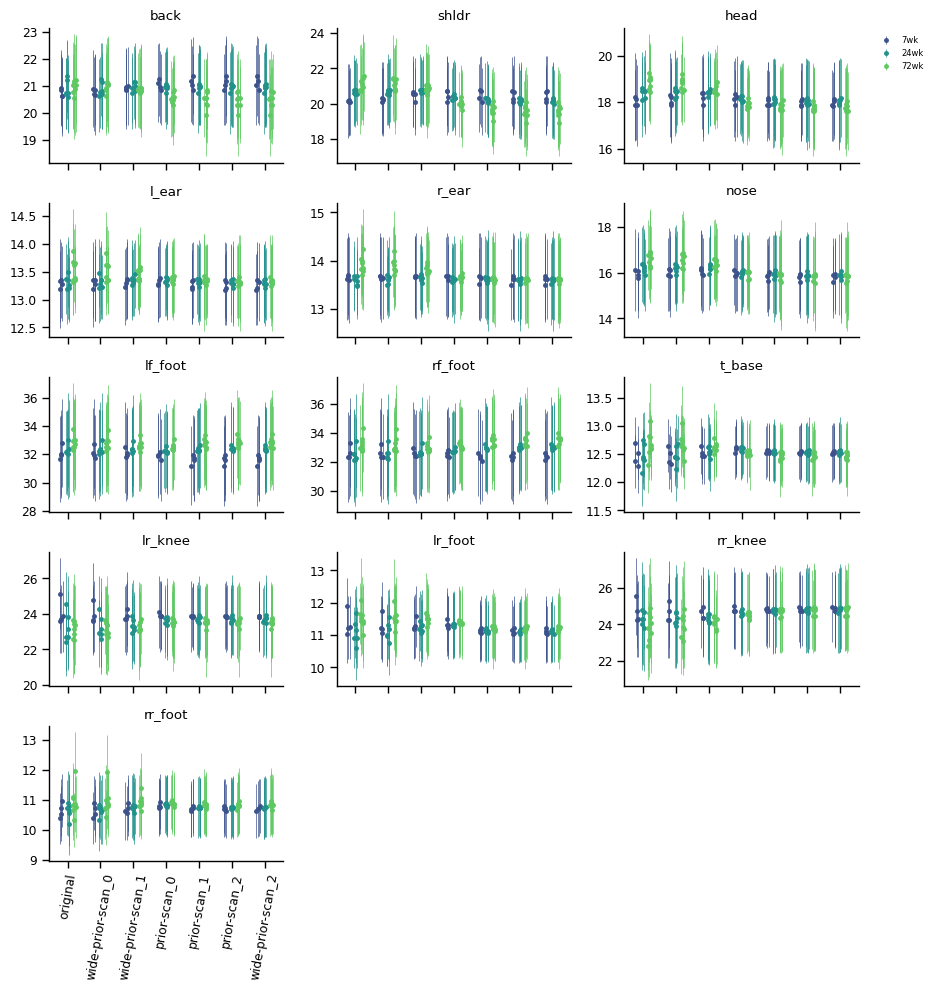

PosixPath('/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/plots/convergence_bl-mean.pdf')

In [62]:
bls_orig, bls_mapd = {m: {} for m in models}, {m: {} for m in models}
for model_name in models:
    bls = jl.load(project.model(model_name) / "bl_distributions.p")
    bls_orig[model_name] = bls["original"]
    bls_mapd[model_name] = bls["morphed"]
all_model_bls = [bls_orig[models[0]]] + [bls_mapd[m] for m in models]

checkpoint = load_localized_model(project.model(models[0]))
dataset, body_inv, _ = scans._dataset_and_bodies_inv(project, models[0])
model = instantiation.get_model(checkpoint["config"])
armature = Armature.from_config(checkpoint["config"]["dataset"])
bone_names = [armature.keypoint_names[int(ix)] for ix in armature.bones[:, 0]] # name by child keypt
ages = {s: int(s.split('_')[0].strip('wk')) for s in dataset.sessions}
age_pal = dict(zip(sorted(set(ages.values())), colors.cts1(len(set(ages.values())))))

ax_size_x = max(1.5, 0.1 * (len(models) + 1) * len(_body_inv) + 0.35 * 3)
fig, ax, ax_grid = viz.util.flat_grid(len(bone_names), 3, ax_size = (ax_size_x, 2), sharex = True, sharey = False)
for i_bone, b_name in enumerate(bone_names):
    body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in body_inv}
    for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
        sessions = body_inv[body]
        nonref_sessions = [s for s in sessions if s != dataset.ref_session]
        ref_sessions = [s for s in sessions if s == dataset.ref_session]
        for is_ref, sess_list in enumerate([nonref_sessions, ref_sessions]):
            xs, strips = viz.util.multi_stripplot(
                [[np.array([a[s][:, i_bone].mean() for s in sess_list]) for a in all_model_bls],
                 [np.array([a[s][:, i_bone].std()  for s in sess_list]) for a in all_model_bls]],
                x = np.arange(len(models) + 1) + (i_body - (len(body_inv)-1) / 2) * min(0.2, 0.8 / len(body_inv)),
                jitter = (1-is_ref) * 0.05,
            )
            kws = dict(
                label = f"{body_age}wk (ref)" if is_ref and len(ref_sessions) else f"{body_age}wk",
                color = '.4' if is_ref else age_pal[int(body_age)],
                elinewidth = 1 if is_ref else 0.5,
            )
            ax[i_bone].errorbar(xs, strips[0], yerr = strips[1], fmt = 'o', ms = 2.5, **kws)
    ax[i_bone].set_title(b_name)
    ax[i_bone].set_xticks(range(len(models) + 1))
    ax[i_bone].set_xticklabels(["original"] + models, rotation = 80)
ax_grid[0, -1].legend(*viz.util.unique_handles(ax[0]), frameon = False, fontsize = 6, bbox_to_anchor = (1.05, 1), loc = 'upper left')
plotter.plot_dir = str(project.root() / "plots")
plotter.finalize(fig, "convergence_bl-mean")

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/wide-prior-scan_0/plots/bone-length-correlations.pdf


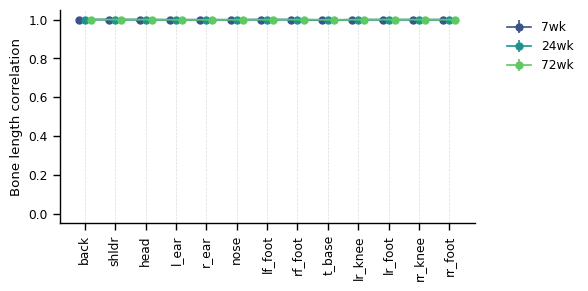

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/wide-prior-scan_1/plots/bone-length-correlations.pdf


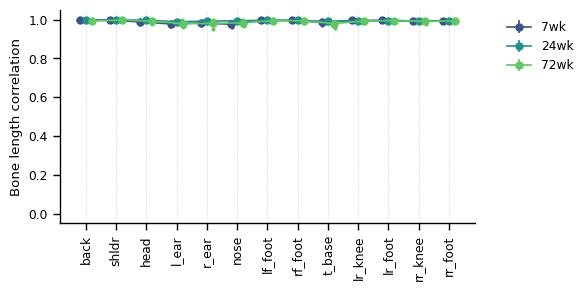

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/wide-prior-scan_2/plots/bone-length-correlations.pdf


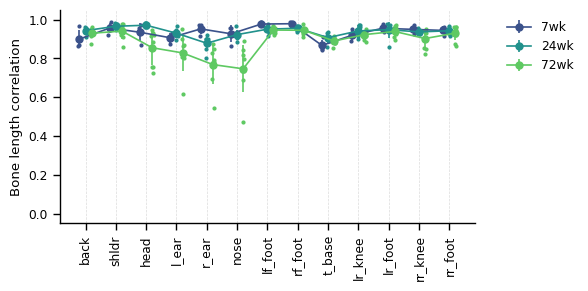

In [250]:
# Correlations
for model_name in models:
    checkpoint = load_localized_model(project.model(model_name))
    dataset, body_inv, _ = scans._dataset_and_bodies_inv(project, model_name)
    model = instantiation.get_model(checkpoint["config"])
    armature = Armature.from_config(checkpoint["config"]["dataset"])
    _inflate = lambda arr: features.inflate(arr, checkpoint["config"]["features"])
    inflated = _inflate(dataset)
    bl_orig = {s: bone_lengths(inflated.get_session(s), armature) for s in dataset.sessions}

    # transform all bodies to the reference body
    params = checkpoint["params"].morph
    # params = jl.load(project.model(model_name) / "averaged_params.p").morph
    mapped = model_util.apply_bodies(
        model.morph,
        params,
        dataset,
        {s: dataset.sess_bodies[dataset.ref_session] for s in dataset.sessions},
    )
    mapped_inflated = _inflate(mapped)
    bl_mapped = {s: bone_lengths(mapped_inflated.get_session(s), armature) for s in dataset.sessions}

    bone_names = [armature.keypoint_names[int(ix)] for ix in armature.bones[:, 0]] # name by child keypt
    ages = {s: int(s.split('_')[0].strip('wk')) for s in dataset.sessions}
    age_pal = dict(zip(sorted(set(ages.values())), colors.cts1(len(set(ages.values())))))

    fig, ax = plt.subplots(1, 1, figsize = (6, 3))
    body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in body_inv}
    for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
        ofs = (i_body - (len(body_ages)-1) / 2) * min(0.2, 0.8 / len(body_ages))
        
        x, usage_strip, (mean_x, mean_strip), (_, std_strip) = viz.util.stripplot(
            *[np.array([
                scipy.stats.pearsonr(bl_orig[s][:, i_bone], bl_mapped[s][:, i_bone]).statistic
            for s in body_inv[body] if s != dataset.ref_session])
            for i_bone in range(len(bone_names))
            ],
            x = np.arange(len(bone_names)),
            apply = (np.mean, np.std),
            jitter = 0.05
        )
        ax.plot(x + ofs, usage_strip, 'o', ms = 2, color = age_pal[body_age])
        ax.errorbar(mean_x + ofs, mean_strip, yerr = std_strip, fmt = '-o', label = f"{body_age}wk", ms = 5, color = age_pal[body_age])
    ax.set_ylabel("Bone length correlation")
    ax.set_ylim(-0.05, 1.05)
    for i in range(len(bone_names)):
        ax.axvline(i, color = colors.subtle, ls = '--', lw = 0.5, alpha = 0.7, zorder  = -3)
    ax.legend(frameon = False, bbox_to_anchor = (1.05, 1), loc = 'upper left')
    ax.set_xticks(np.arange(len(bone_names)))
    ax.set_xticklabels(bone_names, rotation = 90)
    plotter.plot_dir = str(project.model(model_name) / "plots")
    plotter.finalize(fig, "bone-length-correlations")

### Sorting by divergence across cohorts

In [4]:
def model_jsds_across_bodies(
    model_path,
    progress=False,
):
    cfg = config.load_model_config(model_path / "model.yml")
    dataset, _body_inv, _ = scans._dataset_and_bodies_inv(model_path)
    model = instantiation.get_model(cfg)
    checkpoint = methods.load_fit(model_path)

    # transform all sessions to the global reference session's body
    jsds = {}
    bodies = list(_body_inv.keys())
    
    
    ref_body = dataset.sess_bodies[dataset.ref_session]
    mapped = model_util.apply_bodies(
        model.morph,
        checkpoint["params"].morph,
        dataset,
        {s: ref_body for s in dataset.sessions},
    )
    pdfs = {
        s: clouds.PointCloudDensity(k=15).fit(mapped.get_session(s))
        for s in dataset.sessions
    }
    body_pairs = [(b1, b2) for i, b1 in enumerate(bodies) for b2 in bodies[:i]]
    session_pairs = {frozenset((b1, b2)): (_body_inv[b1], _body_inv[b2]) for b1, b2 in body_pairs}
    pbar = model_util._optional_pbar(session_pairs.values(), progress)
    for b1_sessions, b2_sessions in pbar:
        for s1, s2 in iit.product(b1_sessions, b2_sessions):
            jsds[frozenset((s1, s2))] = {
                k: v for k, v in zip((s1, s2), clouds.ball_cloud_js(pdfs[s1], pdfs[s2], average=False))
            }
    return jsds, mapped, session_pairs

In [25]:
model = model_name = 'prior-scan_0'
jsds, mapped_pts, session_pairs = model_jsds_across_bodies(project.model(model), progress = True)

model_path = project.model(model)
cfg = config.load_model_config(model_path / "model.yml")
dataset, _body_inv, _ = scans._dataset_and_bodies_inv(model_path)
model = instantiation.get_model(cfg)
checkpoint = methods.load_fit(model_path)
_inflate = lambda arr: features.inflate(arr, checkpoint["config"]["features"])
armature = Armature.from_config(checkpoint["config"]["dataset"])

100%|██████████| 3/3 [00:05<00:00,  1.75s/it]


##### visualizing high js distance clusters

In [14]:
# PCA of points for visualization
fit_X = np.concatenate([mapped_pts.get_session(s) for s in mapped_pts.sessions], axis = 0)
fit_X = fit_X[np.random.choice(len(fit_X), size = min(10000, len(fit_X)), replace = False)]
pca = PCA(n_components = 2).fit(fit_X)
coords = {s: pca.transform(mapped_pts.get_session(s)) for s in mapped_pts.sessions}

In [12]:
def kde(sample, bw, resolution = 200, buffer = 5, density = False):
    x = np.linspace(sample.min() - buffer * bw, sample.max() + buffer * bw, resolution)
    gauss = lambda x, sample, bw: np.exp(-0.5 * ((sample - x) / bw)**2)
    kde = gauss(x[:, None], sample[None, :], bw).sum(axis = -1)
    if density:
        kde /= kde.sum() * 2 * np.pi * bw**2
    return x, kde

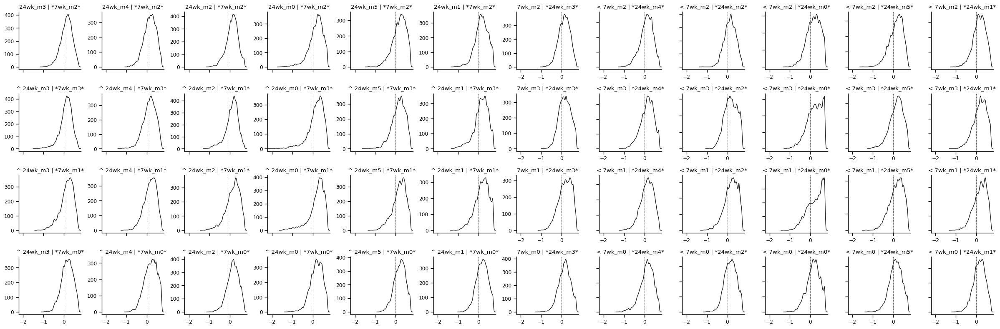

In [116]:


(b1, b2), (b1_s, b2_s) = next(iter(session_pairs.items()))
fig, ax = plt.subplots(len(b2_s), 2 * len(b1_s), figsize = (4 * len(b1_s), 2 * len(b2_s)))
ax1 = ax[:, :len(b1_s)]
ax2 = ax[:, len(b1_s):]
def hide_ticks(group):
    for i, j in iit.product(range(group.shape[0]), range(group.shape[1])):
        ts = []
        if j > 0:
            ts += list(group[i, j].axes.get_yticklabels())
        if i < group.shape[0] - 1:
            ts += list(group[i, j].axes.get_xticklabels())
        for t in ts:
            t.set_visible(False)

xmin, xmax = float('inf'), float('-inf')
for (i_s1, s1), (i_s2, s2) in iit.product(enumerate(b1_s), enumerate(b2_s)):
    j = jsds[frozenset((s1, s2))]
    x, k = kde(j[s1], bw = 0.03)
    xmin, xmax = min(x.min(), xmin), max(x.max(), xmax)
    ax1[i_s2, i_s1].plot(x, k, '-', lw = 1, color = colors.neutral)
    ax1[i_s2, i_s1].set_title(f"{s1} | *{s2}*" if i_s2 == 0 else f"^ {s1} | *{s2}*")
    ax1[i_s2, i_s1].axvline(0, ls = '--', color = colors.neutral, lw = 0.5, zorder = -2)
    x, k = kde(j[s2], bw = 0.03)
    xmin, xmax = min(x.min(), xmin), max(x.max(), xmax)
    ax2[i_s2, i_s1].plot(x, k, '-', lw = 1, color = colors.neutral)
    ax2[i_s2, i_s1].set_title(f"{s2} | *{s1}*" if i_s1 == 0 else f"< {s2} | *{s1}*") 
    ax2[i_s2, i_s1].axvline(0, ls = '--', color = colors.neutral, lw = 0.5, zorder = -2)

for a in iit.chain(ax1.ravel(), ax2.ravel()):
    a.set_xlim(xmin, xmax)

for i in range(len(b1_s)):
    hide_ticks(ax1[:, [i]])
for i in range(len(b2_s)):
    hide_ticks(ax2[[i], :])

plotter.finalize(fig, None)

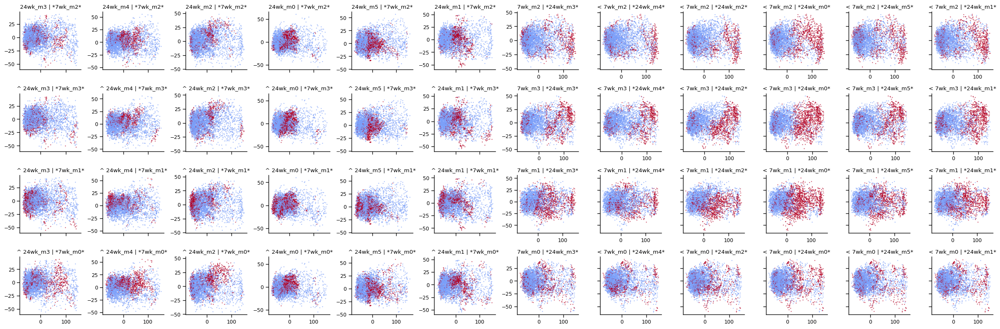

In [156]:
js_thresh = 0.45

(b1, b2), (b1_s, b2_s) = next(iter(session_pairs.items()))
fig, ax = plt.subplots(len(b2_s), 2 * len(b1_s), figsize = (4 * len(b1_s), 2 * len(b2_s)))
ax1 = ax[:, :len(b1_s)]
ax2 = ax[:, len(b1_s):]
def hide_ticks(group):
    for i, j in iit.product(range(group.shape[0]), range(group.shape[1])):
        ts = []
        if j > 0:
            ts += list(group[i, j].axes.get_yticklabels())
        if i < group.shape[0] - 1:
            ts += list(group[i, j].axes.get_xticklabels())
        for t in ts:
            t.set_visible(False)

jmax = max([jsds[frozenset((s1, s2))][s1].max() for (s1, s2) in iit.product(b1_s, b2_s)])
for (i_s1, s1), (i_s2, s2) in iit.product(enumerate(b1_s), enumerate(b2_s)):
    j = jsds[frozenset((s1, s2))]
    ax1[i_s2, i_s1].scatter(*coords[s1].T, s = 1, alpha = 0.5, c = j[s1] > 0.4, vmin = -0.25, cmap = 'coolwarm')
    ax1[i_s2, i_s1].set_title(f"{s1} | *{s2}*" if i_s2 == 0 else f"^ {s1} | *{s2}*") 
    ax2[i_s2, i_s1].scatter(*coords[s2].T, s = 1, alpha = 0.5, c = j[s2] > 0.4, vmin = -0.25, cmap = 'coolwarm') 
    ax2[i_s2, i_s1].set_title(f"{s2} | *{s1}*" if i_s1 == 0 else f"< {s2} | *{s1}*")
    # ax2[i_s2, i_s1].set_title(f"{s2} | {s1}")

for i in range(len(b1_s)):
    hide_ticks(ax1[:, [i]])
for i in range(len(b2_s)):
    hide_ticks(ax2[[i], :])

plotter.finalize(fig, None)

In [157]:
# cluster points with high JS info
js_thresh = 0.45

(b1, b2), (b1_s, b2_s) = next(iter(session_pairs.items()))
thresh_masks = reduce(lambda d1, d2: {**d1, **d2}, [
    {
        (s1, s2): jsds[frozenset((s1, s2))][s1] > js_thresh,
        (s2, s1): jsds[frozenset((s1, s2))][s2] > js_thresh
    }
    for s1, s2 in iit.product(b1_s, b2_s)
], {})
threshed_points = {(s1, s2): mapped.get_session(s1)[mask] for (s1, s2), mask in thresh_masks.items()}
threshed_coords = {(s1, s2): coords[s1][mask] for (s1, s2), mask in thresh_masks.items()}

all_points, slices = io_utils.stack_dict(threshed_points)


In [183]:
n_clust = 5
all_coords = PCA(n_components = 5).fit_transform(all_points)
clusts = KMeans(n_clusters = n_clust).fit_predict(all_coords)

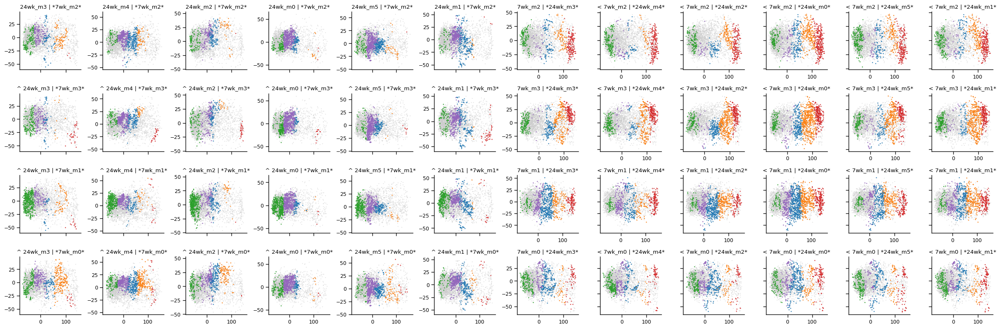

In [184]:
pal = np.array(sns.color_palette('tab10', 10))

(b1, b2), (b1_s, b2_s) = next(iter(session_pairs.items()))
fig, ax = plt.subplots(len(b2_s), 2 * len(b1_s), figsize = (4 * len(b1_s), 2 * len(b2_s)))
ax1 = ax[:, :len(b1_s)]
ax2 = ax[:, len(b1_s):]
def hide_ticks(group):
    for i, j in iit.product(range(group.shape[0]), range(group.shape[1])):
        ts = []
        if j > 0:
            ts += list(group[i, j].axes.get_yticklabels())
        if i < group.shape[0] - 1:
            ts += list(group[i, j].axes.get_xticklabels())
        for t in ts:
            t.set_visible(False)

jmax = max([jsds[frozenset((s1, s2))][s1].max() for (s1, s2) in iit.product(b1_s, b2_s)])
for (i_s1, s1), (i_s2, s2) in iit.product(enumerate(b1_s), enumerate(b2_s)):
    c = clusts[slices[(s1, s2)]]
    ax1[i_s2, i_s1].scatter(*coords[s1].T, s = 0.5, alpha = 0.5, c = colors.subtle, zorder = -2)
    ax1[i_s2, i_s1].scatter(*threshed_coords[(s1, s2)].T, s = 1, alpha = 0.8, c = pal[c])
    ax1[i_s2, i_s1].set_title(f"{s1} | *{s2}*" if i_s2 == 0 else f"^ {s1} | *{s2}*") 
    c = clusts[slices[(s2, s1)]]
    ax2[i_s2, i_s1].scatter(*coords[s2].T, s = 0.5, alpha = 0.5, c = colors.subtle, zorder = -2)
    ax2[i_s2, i_s1].scatter(*threshed_coords[(s2, s1)].T, s = 1, alpha = 0.8, c = pal[c])
    ax2[i_s2, i_s1].set_title(f"{s2} | *{s1}*" if i_s1 == 0 else f"< {s2} | *{s1}*")

for i in range(len(b1_s)):
    hide_ticks(ax1[:, [i]])
for i in range(len(b2_s)):
    hide_ticks(ax2[[i], :])

plotter.finalize(fig, None)


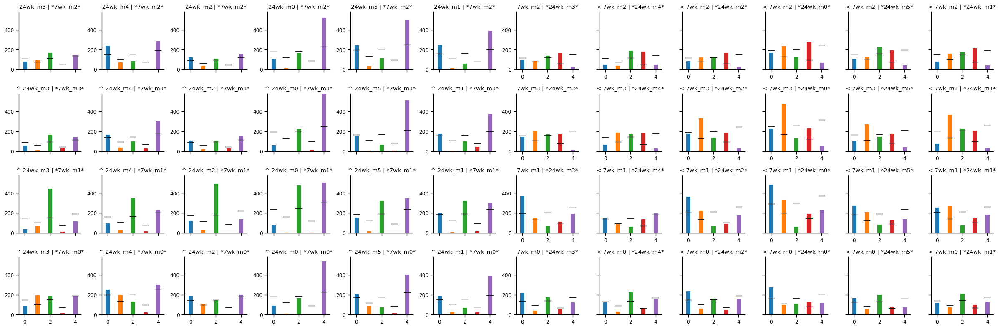

In [193]:
pal = np.array(sns.color_palette('tab10', 10))

def count(arr, vals):
    vals = dict(zip(list(vals), range(len(vals))))
    ret = np.zeros(len(vals))
    uniq, ct = np.unique(arr, return_counts = True)
    for u, c in zip(uniq, ct):
        if u in vals:
            ret[vals[u]] = c
    return ret

(b1, b2), (b1_s, b2_s) = next(iter(session_pairs.items()))
fig, ax = plt.subplots(len(b2_s), 2 * len(b1_s), figsize = (4 * len(b1_s), 2 * len(b2_s)))
ax1 = ax[:, :len(b1_s)]
ax2 = ax[:, len(b1_s):]
def hide_ticks(group):
    for i, j in iit.product(range(group.shape[0]), range(group.shape[1])):
        ts = []
        if j > 0:
            ts += list(group[i, j].axes.get_yticklabels())
        if i < group.shape[0] - 1:
            ts += list(group[i, j].axes.get_xticklabels())
        for t in ts:
            t.set_visible(False)

jmax = max([jsds[frozenset((s1, s2))][s1].max() for (s1, s2) in iit.product(b1_s, b2_s)])
total_counts = count(clusts, np.arange(n_clust)).astype('float')
total_counts /= total_counts.sum()
ymax = float('-inf')
for (i_s1, s1), (i_s2, s2) in iit.product(enumerate(b1_s), enumerate(b2_s)):
    cts = count(clusts[slices[(s1, s2)]], np.arange(n_clust))
    ymax = max(ymax, cts.max())
    barlist = ax1[i_s2, i_s1].bar(np.arange(n_clust), cts, width = 0.3)
    for c, b in zip(pal, barlist):
        b.set_color(c)
    barlist = ax1[i_s2, i_s1].plot(
        np.stack([np.arange(n_clust) + x for x in [-0.25, 0.25]], axis = 0),
        np.stack([total_counts * cts.sum()] * 2, axis = 0),
        color = colors.neutral,
        lw = 1, zorder = 2)

    
    cts = count(clusts[slices[(s2, s1)]], np.arange(n_clust))
    ymax = max(ymax, cts.max())
    barlist = ax2[i_s2, i_s1].bar(np.arange(n_clust), cts, width = 0.3)
    for c, b in zip(pal, barlist):
        b.set_color(c)
    barlist = ax2[i_s2, i_s1].plot(
        np.stack([np.arange(n_clust) + x for x in [-0.25, 0.25]], axis = 0),
        np.stack([total_counts * cts.sum()] * 2, axis = 0),
        color = colors.neutral,
        lw = 1, zorder = 2)
    
    ax1[i_s2, i_s1].set_title(f"{s1} | *{s2}*" if i_s2 == 0 else f"^ {s1} | *{s2}*") 
    ax2[i_s2, i_s1].set_title(f"{s2} | *{s1}*" if i_s1 == 0 else f"< {s2} | *{s1}*")

for a in iit.chain(ax1.ravel(), ax2.ravel()):
    a.set_ylim(None, ymax)


for i in range(len(b1_s)):
    hide_ticks(ax1[:, [i]])
for i in range(len(b2_s)):
    hide_ticks(ax2[[i], :])

plotter.finalize(fig, None)

How to read this
- `24wk_m0`, `m5`, and `m1` have many outlying points (their density >> density
  of comparison `7wk` animal) in cluster 4.
- All `24wk` animals have many outlying points in cluster 2.

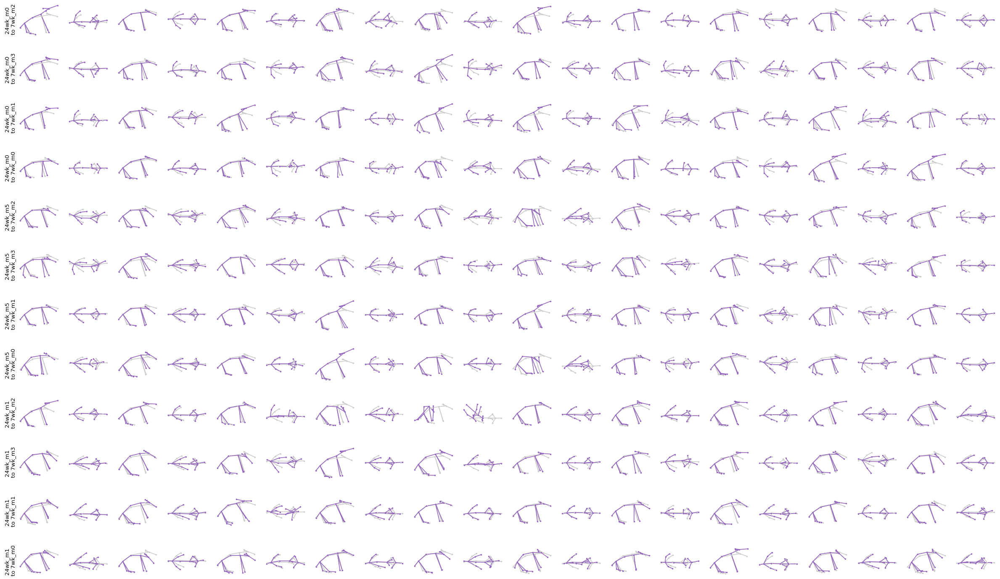

In [201]:
model_path = project.model("prior-scan_2")
cfg = config.load_model_config(model_path / "model.yml")
# dataset, _body_inv, _ = scans._dataset_and_bodies_inv(model_path)
# model = instantiation.get_model(cfg)
checkpoint = methods.load_fit(model_path)
_inflate = lambda arr: features.inflate(arr, checkpoint["config"]["features"])
armature = Armature.from_config(checkpoint["config"]["dataset"])

src_sessions = ["24wk_m0", "24wk_m5", "24wk_m1"]
tgt_sessions = ["7wk_m2", "7wk_m3", "7wk_m1", "7wk_m0"]
clust = 4
n_display = 10

fig, ax = plt.subplots(len(src_sessions) * len(tgt_sessions), 2 * n_display, figsize = (1.5 * 2 * n_display, 1.5 * len(src_sessions) * len(tgt_sessions)))
for i, (src, tgt) in enumerate(iit.product(src_sessions, tgt_sessions)):
    pts = threshed_points[src, tgt][clusts[slices[src, tgt]] == clust]
    mean = pts.mean(axis = 0)
    samp = pts[np.random.choice(len(pts), min(len(pts), n_display), replace = False)]
    for j, feats in enumerate(samp):
        viz.util.plot_mouse_views(
            ax[i, 2 * j : 2 * (j + 1)],
            _inflate(mean), armature,
            color = colors.subtle
        )
        viz.util.plot_mouse_views(
            ax[i, 2 * j : 2 * (j + 1)],
            _inflate(feats), armature,
            color = pal[clust]
        )
        viz.util.axes_off(ax[i, 2 * j : 2 * (j + 1)])
    ax[i, 0].set_ylabel(f"{src}\n to {tgt}")



##### without reduction to outlying points

In [6]:
all_points, slices = io_utils.stack_dict({s : mapped_pts.get_session(s) for s in dataset.sessions})
n_clust = 8
mapped_pca = PCA(n_components = 5, random_state=0)
all_coords = mapped_pca.fit_transform(all_points)
mapped_kmeans = KMeans(n_clusters = n_clust, random_state=0)
clusts = mapped_kmeans.fit_predict(all_coords)

In [7]:
from scipy.spatial import distance
from scipy.cluster import hierarchy

clust_means = np.array([
    all_points[clusts == i].mean(axis = 0)
    for i in range(n_clust)])

# reorder clusters by similarity
# agglomerative cluster to permute rows/cols
dists = distance.pdist(
    clust_means,
    metric = 'euclidean')
ward_matrix = hierarchy.ward(dists)
clust_ordering = hierarchy.leaves_list(
    hierarchy.optimal_leaf_ordering(ward_matrix, dists))
new_clusts = np.argsort(clust_ordering)[clusts]
clust_means = clust_means[clust_ordering]

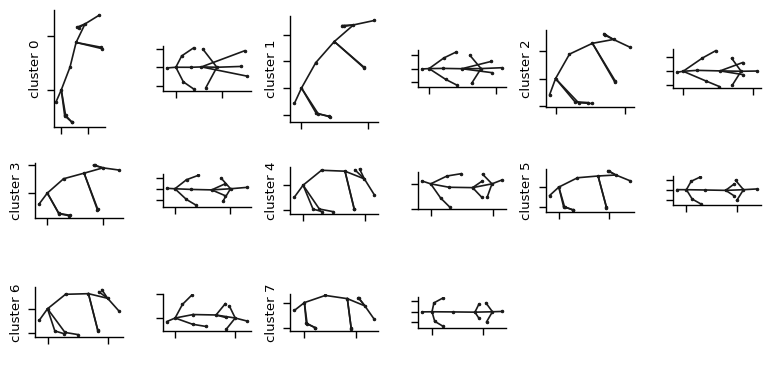

In [8]:
fig, ax, ax_grid = viz.util.flat_grid(2 * n_clust, 6, ax_size = (1.3, 1.3))
for i in range(n_clust):
    viz.util.plot_mouse_views(ax[i*2 : 2*(i+1)], _inflate(clust_means[i]), armature, color = colors.neutral)
    ax[i*2].set_ylabel(f"cluster {i}")
for a in ax:
    for t in list(a.axes.get_yticklabels()) + list(a.axes.get_xticklabels()):
        t.set_visible(False)
# viz.util.axes_off(ax_grid)
plotter.finalize(fig, None)

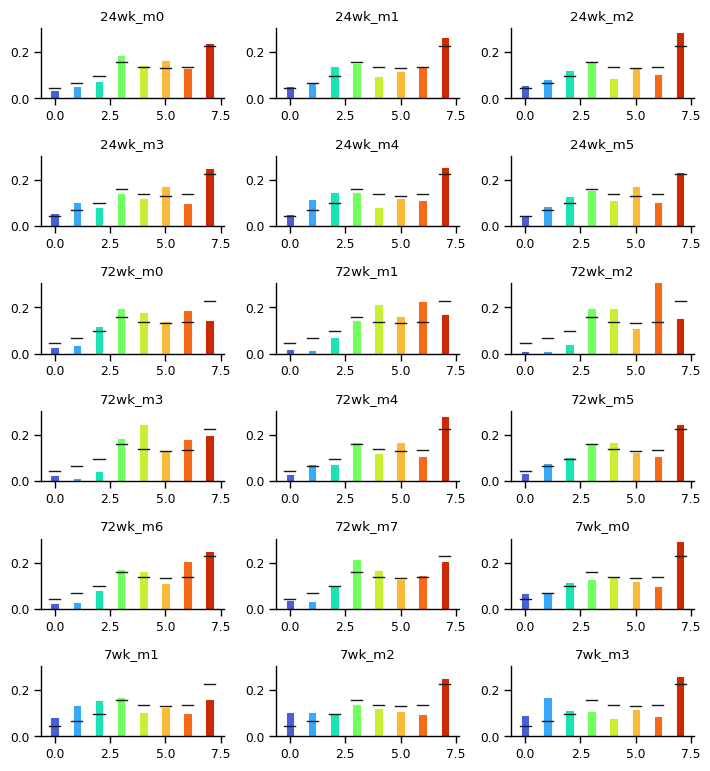

In [9]:
pal = np.array(sns.color_palette('turbo', n_clust))

def count(arr, vals):
    vals = dict(zip(list(vals), range(len(vals))))
    ret = np.zeros(len(vals))
    uniq, ct = np.unique(arr, return_counts = True)
    for u, c in zip(uniq, ct):
        if u in vals:
            ret[vals[u]] = c
    return ret


fig, ax, ax_grid = viz.util.flat_grid(len(slices), 3, ax_size=(2.4, 1.3), subplot_kw={'sharex': True, 'sharey':True})

total_counts = count(new_clusts, np.arange(n_clust)).astype('float')
total_counts /= total_counts.sum()
ymax = float('-inf')
for i, s in enumerate(slices):
    cts = count(new_clusts[slices[s]], np.arange(n_clust))
    ymax = max(ymax, (cts / cts.sum()).max())
    barlist = ax[i].bar(np.arange(n_clust), cts / cts.sum(), width = 0.3)
    for c, b in zip(pal, barlist):
        b.set_color(c)
    barlist = ax[i].plot(
        np.stack([np.arange(n_clust) + x for x in [-0.25, 0.25]], axis = 0),
        np.stack([total_counts] * 2, axis = 0),
        color = colors.neutral,
        lw = 1, zorder = 2)
    ax[i].set_title(s) 

for a in ax:
    a.set_ylim(None, ymax)

plotter.finalize(fig, None)

##### clusters 6, 7, 8, 9

In [29]:
cos = lambda a, b: np.clip((a * b).sum(axis = -1) / (np.linalg.norm(a, axis = -1) * np.linalg.norm(b, axis = -1)), -1, 1)
elevation = lambda arr: (np.arccos(cos(arr, arr * np.array([1, 1, 0])[None])) * np.sign(arr[:, 2])) * 180 / np.pi
rotation = lambda arr: (np.arccos(cos(arr, arr * np.array([1, 0, 1])[None])) * np.sign(arr[:, 1])) * 180 / np.pi

In [ ]:
### quantify separability of these four clusters

In [166]:
all_kpts = _inflate(all_points)
angle_feats = np.stack([f(all_kpts[:, i]) for i in (head_ix, back_ix, shldr_ix) for f in [elevation, rotation]], axis = -1)
angle_feats = (angle_feats - angle_feats.mean(axis = 0)) / angle_feats.std(axis = 0)

mask = reduce(np.bitwise_or, [new_clusts == cl for cl in display]) # in display clusters

##### clusters in angle parameter space post-morph, transferred onto pre-morph

In [173]:
### actually, how well can you separate *all* of the clusters using these angle coords?

In [211]:
angle_feats = np.stack([f(all_kpts[:, i]) for i in range(all_kpts.shape[1]) for f in [elevation, rotation]], axis = -1)
af_means, af_stds = angle_feats.mean(axis = 0), angle_feats.std(axis = 0)
angle_feats = (angle_feats - af_means) / af_stds

svc = SVC(kernel = 'rbf').fit(angle_feats, new_clusts)
predicted = svc.predict(angle_feats)
confusion = confusion_matrix(new_clusts, predicted)


In [ ]:
### are the angle metrics preserved by the morph?

In [184]:
all_orig_pts, orig_slices = io_utils.stack_dict({s : dataset.get_session(s) for s in dataset.sessions})
all_orig_kpts = _inflate(all_orig_pts)
orig = [[f(all_orig_kpts[:, i]) for i in range(all_kpts.shape[1])] for f in [elevation, rotation]]
mapd = [[f(     all_kpts[:, i]) for i in range(all_kpts.shape[1])] for f in [elevation, rotation]]

/Users/kaifox/projects/mph/generative_api/kpsn/viz/util.py:255: RuntimeWarning: Mean of empty slice
  applied = tuple([np.atleast_1d(g(arr)) for arr in arrs] for g in apply)
/Users/kaifox/bin/miniconda3/envs/kpsn-dev/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


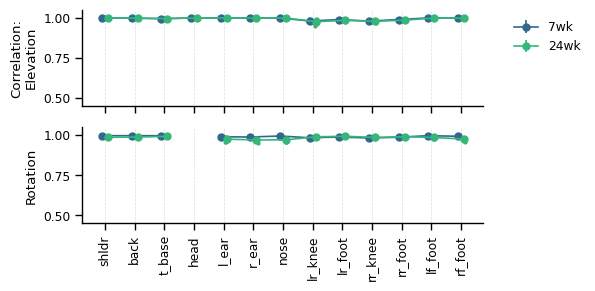

In [248]:
import scipy.stats

fig, ax = plt.subplots(2, 1, figsize = (6, 3), sharex = True)
body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
keypt_ixs, keypt_names = zip(*[(i, k) for (i, k) in enumerate(list(armature.keypoint_names.values())) if k != 'hips'])
for i in range(2):
    for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
        ofs = (i_body - (len(body_ages)-1) / 2) * min(0.2, 0.8 / len(body_ages))
        
        x, usage_strip, (mean_x, mean_strip), (_, std_strip) = viz.util.stripplot(
            *[
                np.array([
                    scipy.stats.pearsonr(orig[i][i_kp][orig_slices[s]], mapd[i][i_kp][slices[s]]).statistic
                    for s in _body_inv[body] if s != dataset.ref_session
                ])
                if not(kp_name == 'head' and i == 1) else np.array([])
                for i_kp, kp_name in zip(keypt_ixs, keypt_names)
            ],
            x = np.arange(len(keypt_names)),
            apply = (np.nanmean, np.nanstd),
            jitter = 0.05
        )
        ax[i].plot(x + ofs, usage_strip, 'o', ms = 2, color = age_pal[body_age])
        ax[i].errorbar(mean_x + ofs, mean_strip, yerr = std_strip, fmt = '-o', label = f"{body_age}wk", ms = 5, color = age_pal[body_age])
    for j in range(len(keypt_names)):
        ax[i].axvline(j, color = colors.subtle, ls = '--', lw = 0.5, alpha = 0.7, zorder  = -3)
    ax[i].set_ylim(0.45, 1.05)
ax[0].set_ylabel("Correlation:\nElevation")
ax[1].set_ylabel("Rotation")

ax[0].legend(frameon = False, bbox_to_anchor = (1.05, 1), loc = 'upper left')
ax[1].set_xticks(np.arange(len(keypt_names)))
ax[1].set_xticklabels(keypt_names, rotation = 90)
plotter.finalize(fig, None)

/Users/kaifox/projects/mph/generative_api/kpsn/viz/util.py:255: RuntimeWarning: Mean of empty slice
  applied = tuple([np.atleast_1d(g(arr)) for arr in arrs] for g in apply)
/Users/kaifox/bin/miniconda3/envs/kpsn-dev/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


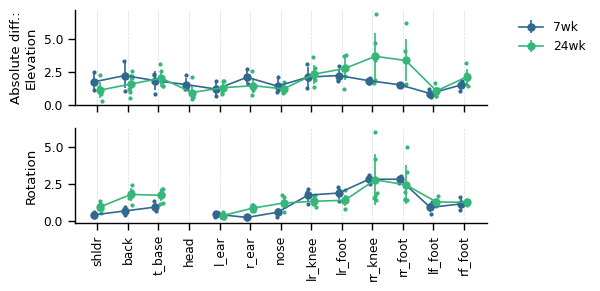

In [244]:
fig, ax = plt.subplots(2, 1, figsize = (6, 3), sharex = True)
body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
keypt_ixs, keypt_names = zip(*[(i, k) for (i, k) in enumerate(list(armature.keypoint_names.values())) if k != 'hips'])
for i in range(2):
    for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
        ofs = (i_body - (len(body_ages)-1) / 2) * min(0.2, 0.8 / len(body_ages))
        
        x, usage_strip, (mean_x, mean_strip), (_, std_strip) = viz.util.stripplot(
            *[
                np.array([
                    abs(orig[i][i_kp][orig_slices[s]] - mapd[i][i_kp][slices[s]]).mean()
                    for s in _body_inv[body] if s != dataset.ref_session
                ])
                if not(kp_name == 'head' and i == 1) else np.array([])
                for i_kp, kp_name in zip(keypt_ixs, keypt_names)
            ],
            x = np.arange(len(keypt_names)),
            apply = (np.nanmean, np.nanstd),
            jitter = 0.05
        )
        ax[i].plot(x + ofs, usage_strip, 'o', ms = 2, color = age_pal[body_age])
        ax[i].errorbar(mean_x + ofs, mean_strip, yerr = std_strip, fmt = '-o', label = f"{body_age}wk", ms = 5, color = age_pal[body_age])
    for j in range(len(keypt_names)):
        ax[i].axvline(j, color = colors.subtle, ls = '--', lw = 0.5, alpha = 0.7, zorder  = -3)
    # ax[i].set_ylim(-0.05, 1.05)
ax[0].set_ylabel("Absolute diff.:\nElevation")
ax[1].set_ylabel("Rotation")

ax[0].legend(frameon = False, bbox_to_anchor = (1.05, 1), loc = 'upper left')
ax[1].set_xticks(np.arange(len(keypt_names)))
ax[1].set_xticklabels(keypt_names, rotation = 90)
plotter.finalize(fig, None)

In [199]:
# NOTE: head rotation is locked to zero by alignment, and hips are locked to the
# origin, so these are omitted above

In [ ]:
# out of curiosity, does the morph change joint angles?

In [204]:
bone_locations = lambda keypts, armature: np.stack([
    keypts[..., armature.bones[i, 1], :] - keypts[..., armature.bones[i, 0], :]
    for i in range(len(armature.bones))
], axis = -2)

In [205]:
orig_bones = bone_locations(all_orig_kpts, armature)
mapd_bones = bone_locations(all_kpts, armature)
orig_ja = [[f(orig_bones[:, i]) for i in range(orig_bones.shape[1])] for f in [elevation, rotation]]
mapd_ja = [[f(mapd_bones[:, i]) for i in range(mapd_bones.shape[1])] for f in [elevation, rotation]]

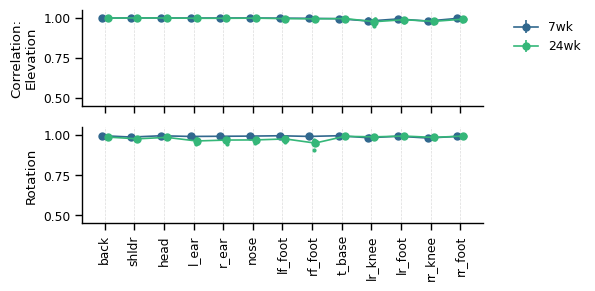

In [247]:
import scipy.stats

fig, ax = plt.subplots(2, 1, figsize = (6, 3), sharex = True)
body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
bone_names = [armature.keypoint_names[int(ix)] for ix in armature.bones[:, 0]] # name by child keypt

for i in range(2):
    for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
        ofs = (i_body - (len(body_ages)-1) / 2) * min(0.2, 0.8 / len(body_ages))
        
        x, usage_strip, (mean_x, mean_strip), (_, std_strip) = viz.util.stripplot(
            *[
                np.array([
                    scipy.stats.pearsonr(orig_ja[i][i_bone][orig_slices[s]], mapd_ja[i][i_bone][slices[s]]).statistic
                    for s in _body_inv[body] if s != dataset.ref_session
                ])
                for i_bone in range(len(bone_names))
            ],
            x = np.arange(len(bone_names)),
            apply = (np.nanmean, np.nanstd),
            jitter = 0.05
        )
        ax[i].plot(x + ofs, usage_strip, 'o', ms = 2, color = age_pal[body_age])
        ax[i].errorbar(mean_x + ofs, mean_strip, yerr = std_strip, fmt = '-o', label = f"{body_age}wk", ms = 5, color = age_pal[body_age])
    for j in range(len(bone_names)):
        ax[i].axvline(j, color = colors.subtle, ls = '--', lw = 0.5, alpha = 0.7, zorder  = -3)
    ax[i].set_ylim(0.45, 1.05)
ax[0].set_ylabel("Correlation:\nElevation")
ax[1].set_ylabel("Rotation")

ax[0].legend(frameon = False, bbox_to_anchor = (1.05, 1), loc = 'upper left')
ax[1].set_xticks(np.arange(len(bone_names)))
ax[1].set_xticklabels(bone_names, rotation = 90)
plotter.finalize(fig, None)


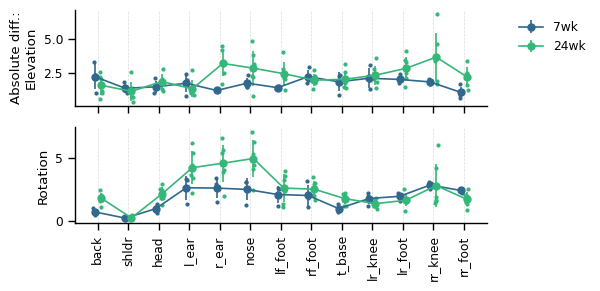

In [245]:
fig, ax = plt.subplots(2, 1, figsize = (6, 3), sharex = True)
body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
bone_names = [armature.keypoint_names[int(ix)] for ix in armature.bones[:, 0]] # name by child keypt

for i in range(2):
    for i_body, (body, body_age) in enumerate(sorted(body_ages.items(), key=lambda kv: kv[1])):
        ofs = (i_body - (len(body_ages)-1) / 2) * min(0.2, 0.8 / len(body_ages))
        
        x, usage_strip, (mean_x, mean_strip), (_, std_strip) = viz.util.stripplot(
            *[
                np.array([
                    abs(orig_ja[i][i_bone][orig_slices[s]] - mapd_ja[i][i_bone][slices[s]]).mean()
                    for s in _body_inv[body] if s != dataset.ref_session
                ])
                for i_bone in range(len(bone_names))
            ],
            x = np.arange(len(bone_names)),
            apply = (np.nanmean, np.nanstd),
            jitter = 0.05
        )
        ax[i].plot(x + ofs, usage_strip, 'o', ms = 2, color = age_pal[body_age])
        ax[i].errorbar(mean_x + ofs, mean_strip, yerr = std_strip, fmt = '-o', label = f"{body_age}wk", ms = 5, color = age_pal[body_age])
    for j in range(len(bone_names)):
        ax[i].axvline(j, color = colors.subtle, ls = '--', lw = 0.5, alpha = 0.7, zorder  = -3)
    # ax[i].set_ylim(-0.05, 1.05)
ax[0].set_ylabel("Absolute diff.:\nElevation")
ax[1].set_ylabel("Rotation")

ax[0].legend(frameon = False, bbox_to_anchor = (1.05, 1), loc = 'upper left')
ax[1].set_xticks(np.arange(len(bone_names)))
ax[1].set_xticklabels(bone_names, rotation = 90)
plotter.finalize(fig, None)


### Scatterplot PC distributions

In [160]:
def data_mapped_to_reference(
    model_path,
    params = None,
):
    cfg = config.load_model_config(model_path / "model.yml")
    model = instantiation.get_model(cfg)
    checkpoint = methods.load_fit(model_path)

    # transform all sessions to the global reference session's body
    if params is None:
        params = checkpoint["params"].morph
    ref_body = dataset.sess_bodies[dataset.ref_session]
    mapped = model_util.apply_bodies(
        model.morph,
        params,
        dataset,
        {s: ref_body for s in dataset.sessions},
    )
    return dataset, mapped, _body_inv, checkpoint

In [161]:
def grouped_scatter(points, slices, _body_inv, xaxis, yaxis, ax_size = 1.3, highlight = None):
    max_per_age = max(len(grp) for grp in _body_inv.values())
    body_ages = {b: int(b.split('-')[1].split('_')[0].strip('wk')) for b in _body_inv}
    ages = sorted(list(set(body_ages.values())))
    age_pal = dict(zip(ages, colors.cts1(len(set(ages)))))
    age_rows = dict(zip(ages, np.arange(len(ages))))

    fig, ax = plt.subplots(len(ages), max_per_age + 1, figsize = (ax_size * (max_per_age + 1), ax_size * len(ages)))
    viz.util.axes_off(ax[:-1, 1:])
    for a in ax[:-1, 0]:
        sns.despine(ax = a, left = False, bottom = True)
        a.set_xticks([])
    for a in ax[-1, 1:]:
        sns.despine(ax = a, left = True, bottom = False)
        a.set_yticks([])
    sns.despine(ax = ax[-1, 0])
    

    col_counter = {age: 0 for age in ages}

    for i in range(len(ages)):
        ax[i, 0].scatter(
            points[:, xaxis], points[:, yaxis],
            s = 0.005, marker = '.', color = '.8', rasterized = True)
        # ax[i, 0].set_aspect(1.)

    for i_body, (body, sessions) in enumerate(_body_inv.items()):
        age = body_ages[body]
        for s in sessions:

            curr_ax = ax[age_rows[age], col_counter[age] + 1]
            col_counter[age] += 1

            curr_ax.scatter(
                points[:, xaxis], points[:, yaxis],
                s = 0.005, marker = '.', color = '.8', rasterized = True)

            slc = slices[s]
            color = age_pal[age]
            if highlight is not None and s == highlight:
                color = '.2'
            curr_ax.scatter(
                points[slc, xaxis], points[slc, yaxis],
                s = 0.01, color = color, rasterized = True)
            ax[age_rows[age], 0].scatter(
                points[slc, xaxis], points[slc, yaxis],
                s = 0.01, marker = '.', color = age_pal[age], rasterized = True)
            
        ax[age_rows[age], 0].set_ylabel((f"PC {yaxis} \n" if age_rows[age] == 0 else "") + f"{age}wk")
    
    ax[-1, 0].set_xlabel(f"PC {xaxis}")

    return fig, ax

def component_logprobs_plos(coords, logprobs, xaxis, yaxis):
    n_comp = logprobs.shape[-1]
    fig, ax, ax_grid = viz.util.flat_grid(n_comp, 7, ax_size = (1.3, 1.3),)
    for i in range(n_comp):
        ax[i].scatter(coords[:, xaxis], coords[:, yaxis], s = 0.005, marker = '.', c = logprobs[:, i], rasterized = True, cmap = 'viridis')
        ax[i].set_title(f"Component {i}")
    viz.util.axes_off(ax)
    ax_grid[0, 0].set_ylabel(f"PC {yaxis}")
    ax_grid[-1, 0].set_xlabel(f"PC {xaxis}")
    return fig, ax


/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed_pc0-pc1.pdf


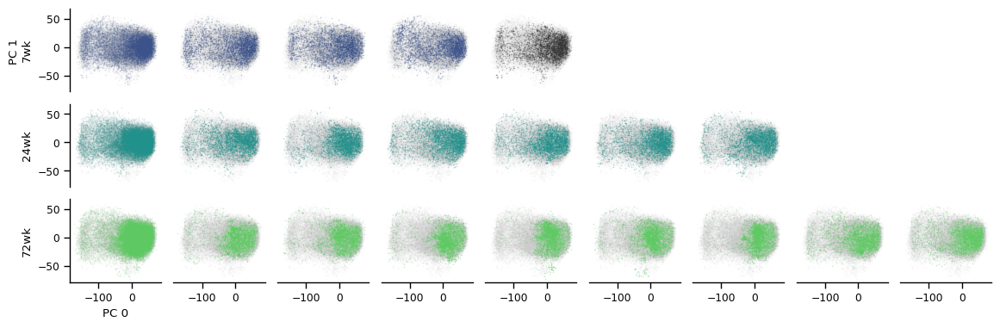

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/unmorphed_pc0-pc1.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed-logprobs_pc0-pc1.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed_pc1-pc2.pdf


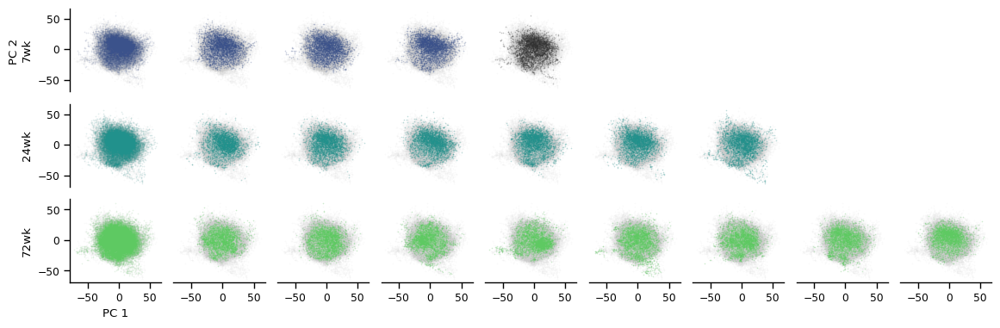

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/unmorphed_pc1-pc2.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed-logprobs_pc1-pc2.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed_pc2-pc3.pdf


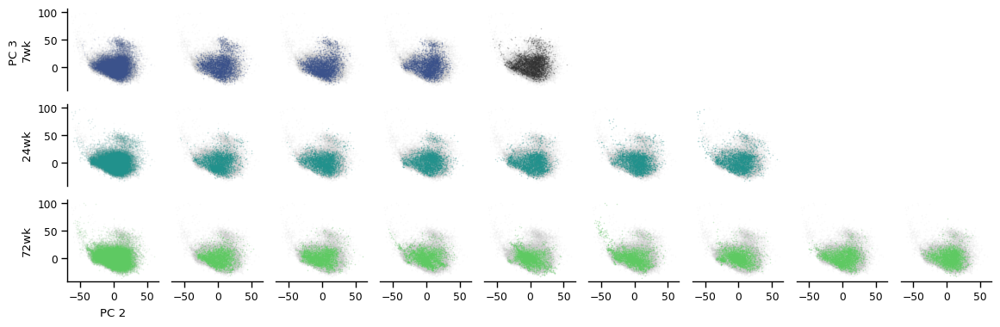

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/unmorphed_pc2-pc3.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed-logprobs_pc2-pc3.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed_pc3-pc4.pdf


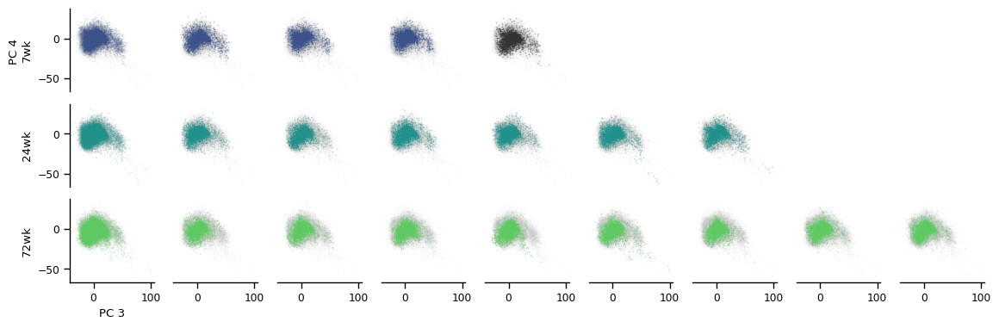

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/unmorphed_pc3-pc4.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed-logprobs_pc3-pc4.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed_pc4-pc5.pdf


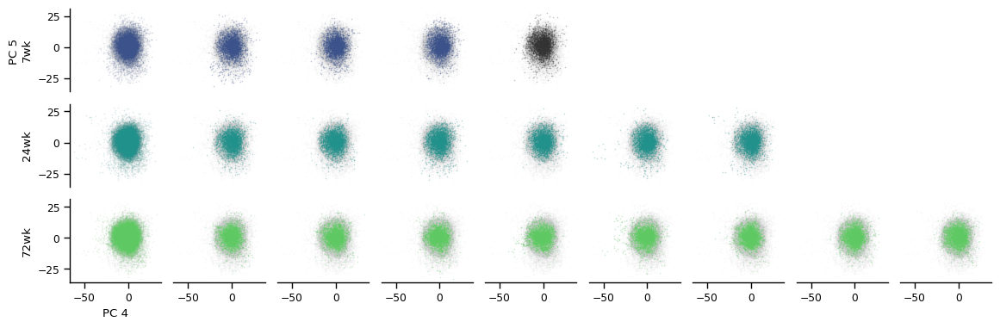

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/unmorphed_pc4-pc5.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_0/plots/morphed_points/morphed-logprobs_pc4-pc5.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed_pc0-pc1.pdf


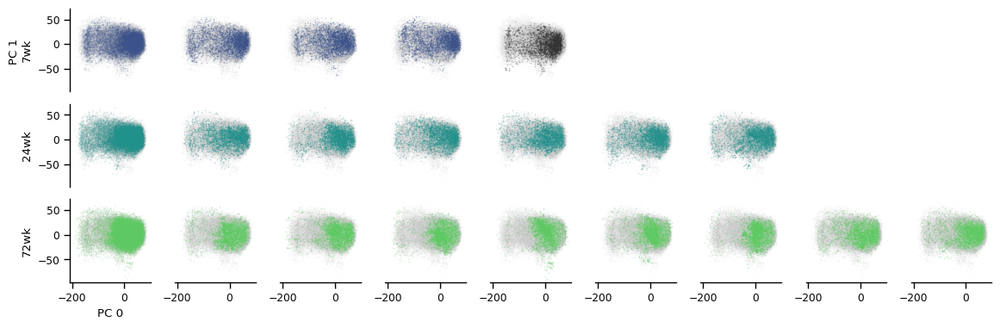

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/unmorphed_pc0-pc1.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed-logprobs_pc0-pc1.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed_pc1-pc2.pdf


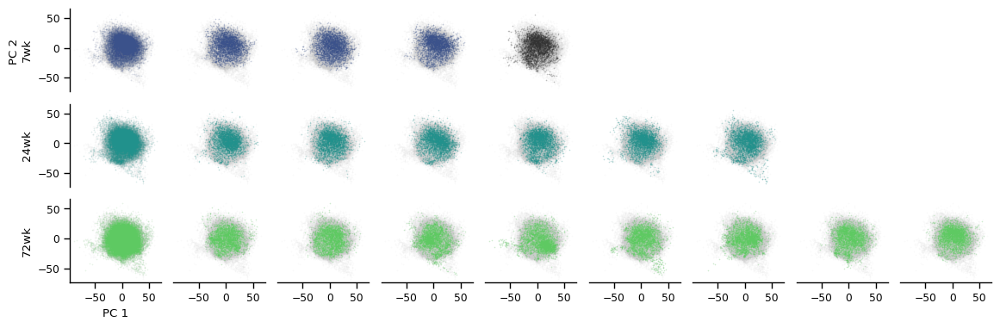

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/unmorphed_pc1-pc2.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed-logprobs_pc1-pc2.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed_pc2-pc3.pdf


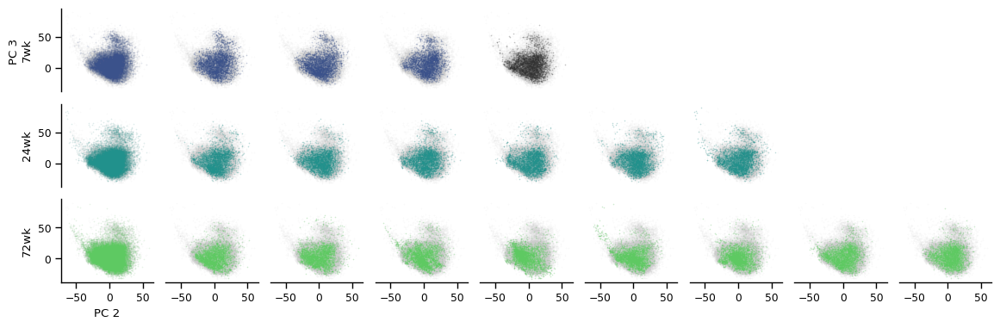

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/unmorphed_pc2-pc3.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed-logprobs_pc2-pc3.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed_pc3-pc4.pdf


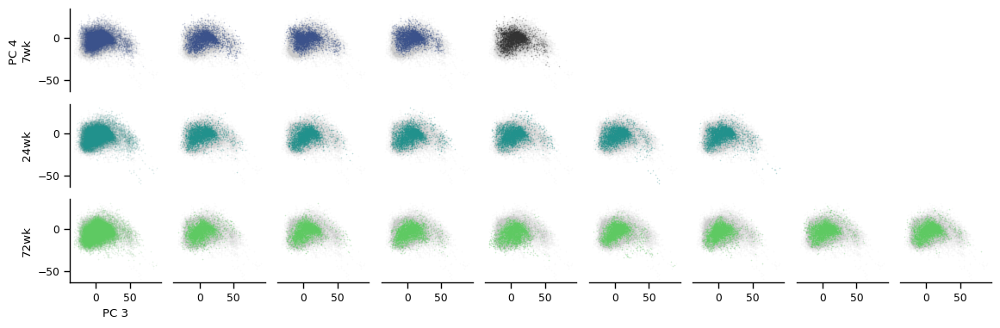

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/unmorphed_pc3-pc4.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed-logprobs_pc3-pc4.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed_pc4-pc5.pdf


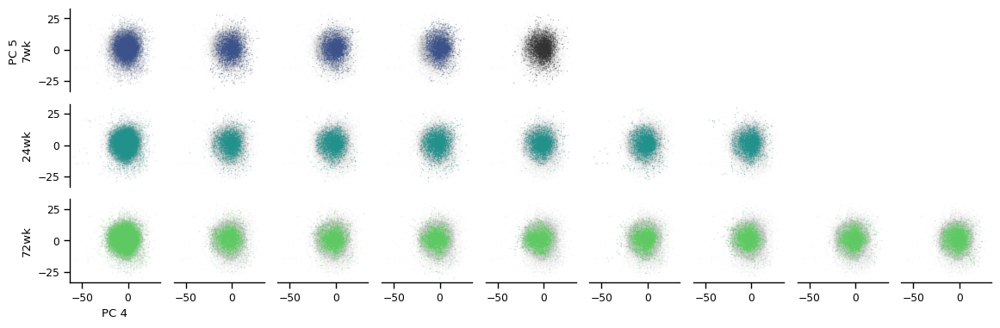

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/unmorphed_pc4-pc5.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_1/plots/morphed_points/morphed-logprobs_pc4-pc5.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed_pc0-pc1.pdf


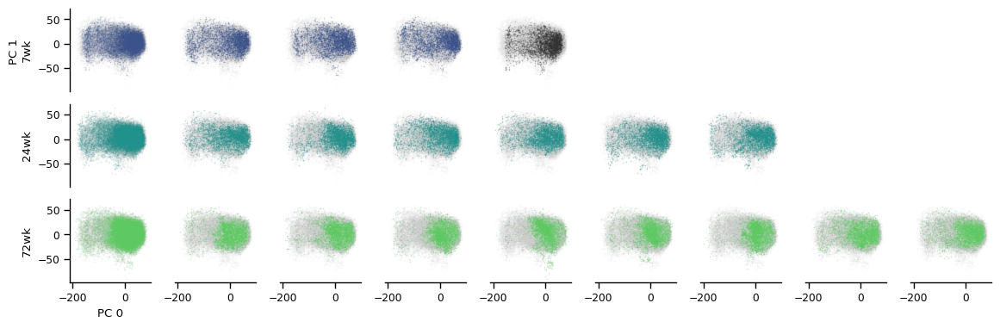

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/unmorphed_pc0-pc1.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed-logprobs_pc0-pc1.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed_pc1-pc2.pdf


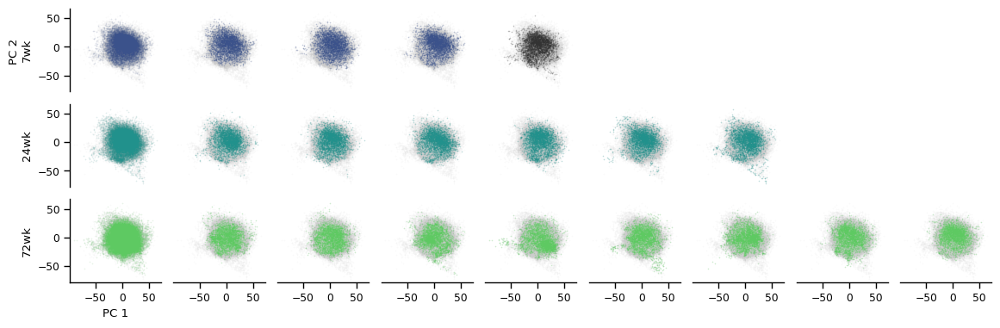

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/unmorphed_pc1-pc2.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed-logprobs_pc1-pc2.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed_pc2-pc3.pdf


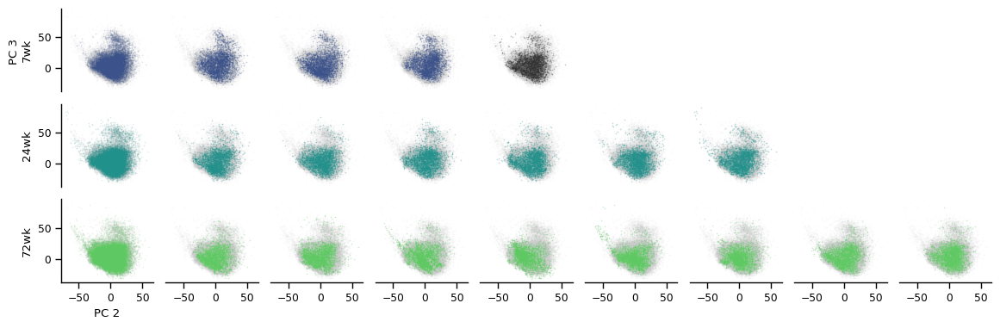

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/unmorphed_pc2-pc3.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed-logprobs_pc2-pc3.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed_pc3-pc4.pdf


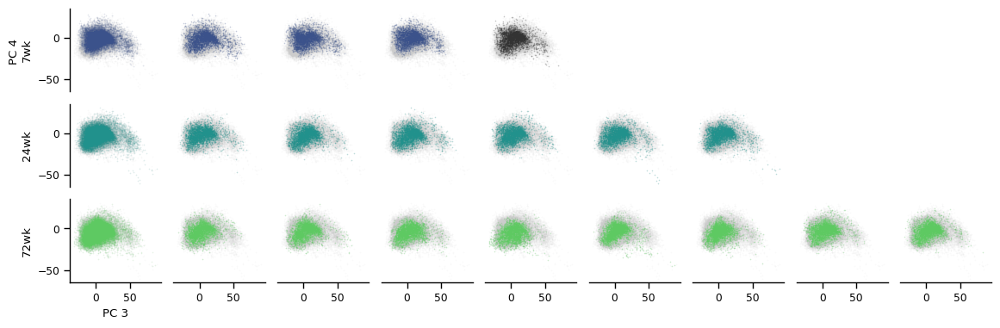

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/unmorphed_pc3-pc4.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed-logprobs_pc3-pc4.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed_pc4-pc5.pdf


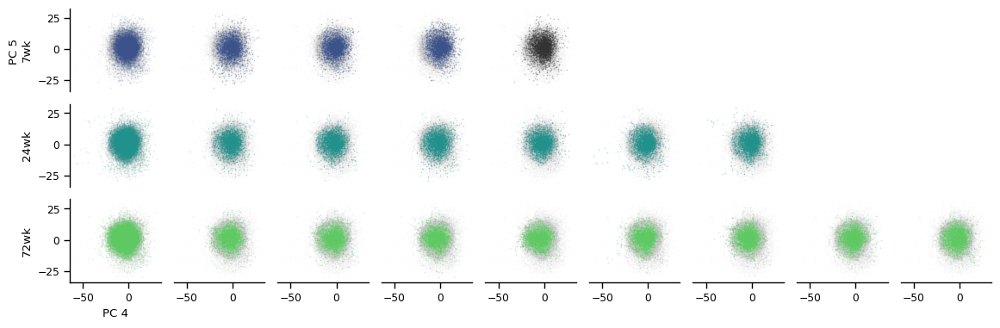

/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/unmorphed_pc4-pc5.pdf
/Users/kaifox/projects/mph/data_explore/testsets/moont-7.24.72-distprior/models/prior-scan_2/plots/morphed_points/morphed-logprobs_pc4-pc5.pdf


In [162]:

induced_kpts = {}
for model_name in model_util._optional_pbar(models, progress):
    plot_dir = project.model(model_name) / "plots" / "morphed_points"

    dataset, mapped, _body_inv, checkpoint = data_mapped_to_reference(project.model(model_name))
    coords, _, _ = morph.lowrank_affine.mode_components(checkpoint["params"].morph, mapped.data)
    logprobs = pose.gmm.pose_logprob(checkpoint["params"].pose, mapped)

    farse_params = checkpoint["params"].morph
    farse_params._tree["_mode_updates"] = jnp.zeros_like(farse_params._tree["_mode_updates"])
    farse_params._tree["_offset_updates"] = jnp.zeros_like(farse_params._tree["_offset_updates"])

    _, farse_mapped, _, _ = data_mapped_to_reference(project.model(model_name), params = farse_params)
    farse_coords, _, _, = morph.lowrank_affine.mode_components(farse_params, farse_mapped.data)

    for xaxis, yaxis in [(0, 1), (1, 2), (2, 3), (3, 4), (4, 5)]:
        fig, ax = grouped_scatter(coords, mapped.slices, _body_inv, xaxis, yaxis, highlight = dataset.ref_session)
        plotter.finalize(fig, f"morphed_pc{xaxis}-pc{yaxis}", despine = False, display=True, path = plot_dir)
        fig, ax = grouped_scatter(farse_coords, mapped.slices, _body_inv, xaxis, yaxis, highlight = dataset.ref_session)
        plotter.finalize(fig, f"unmorphed_pc{xaxis}-pc{yaxis}", despine = False, display=False, path = plot_dir)

        fig, ax = component_logprobs_plos(coords, logprobs, xaxis, yaxis)
        plotter.finalize(fig, f"morphed-logprobs_pc{xaxis}-pc{yaxis}", display = False, despine = False, path = plot_dir)
        plt.close('all')

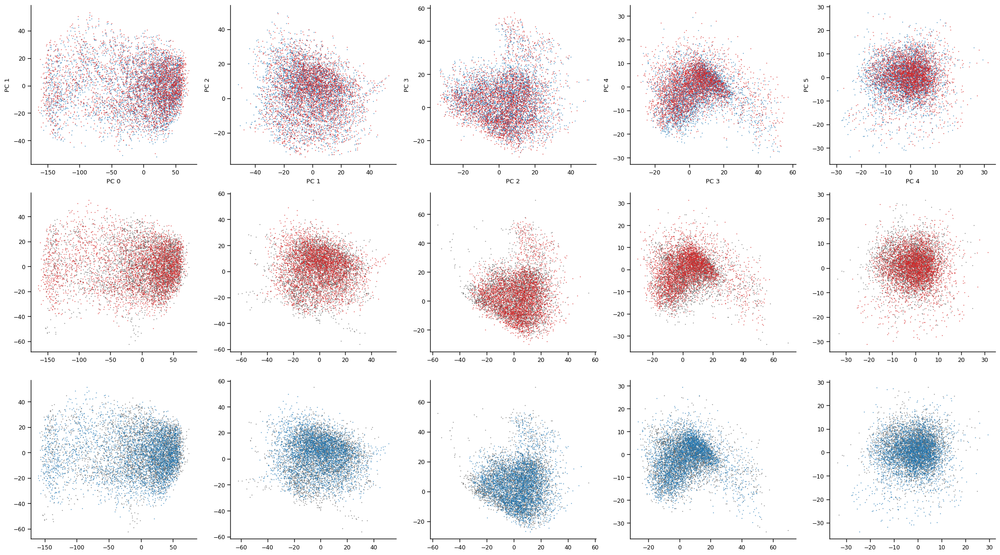

In [279]:
model_name = 'prior-scan_0'

dataset, mapped, _body_inv, checkpoint = data_mapped_to_reference(project.model(model_name))
coords, _, _ = morph.lowrank_affine.mode_components(checkpoint["params"].morph, mapped.data)

farse_params = checkpoint["params"].morph
farse_params._tree["_mode_updates"] = jnp.zeros_like(farse_params._tree["_mode_updates"])
farse_params._tree["_offset_updates"] = jnp.zeros_like(farse_params._tree["_offset_updates"])

_, farse_mapped, _, _ = data_mapped_to_reference(project.model(model_name), params = farse_params)
farse_coords, _, _, = morph.lowrank_affine.mode_components(farse_params, farse_mapped.data)

xys = [(0, 1), (1, 2), (2, 3), (3, 4), (4, 5)]
fig, ax = plt.subplots(3, len(xys), figsize = (len(xys) * 4.3, 12.))

highlight = "7wk_m2"
selected_id = dataset._session_names.inverse[highlight]
mask = np.zeros(len(dataset.data), dtype = bool)
mask[dataset.get_slice(highlight)] = True
refmask = np.zeros(len(dataset.data), dtype = bool)
refmask[dataset.get_slice(dataset.ref_session)] = True

for i, (xaxis, yaxis) in enumerate(xys):

    # ax[i].scatter(coords[notmask, xaxis], coords[notmask, yaxis], s = 0.01, marker = '.', c = '.8', rasterized = True)
    for row, (coors, m, c) in enumerate([(farse_coords, mask, 'C0'), (coords, mask, colors.C[0])]): 
        ax[0, i].scatter(coors[mask, xaxis], coors[mask, yaxis], s = 0.8, marker = '.', c = c, rasterized = True)
    for row, (coors, m, c) in enumerate([(coords, refmask, '.4'), (coords, mask, colors.C[0])]): 
        ax[1, i].scatter(coors[m, xaxis], coors[m, yaxis], s = 0.8, marker = '.', c = c, rasterized = True)
    for row, (coors, m, c) in enumerate([(coords, refmask, '.4'), (farse_coords, mask, 'C0')]): 
        ax[2, i].scatter(coors[m, xaxis], coors[m, yaxis], s = 0.8, marker = '.', c = c, rasterized = True)
    ax[0, i].set_xlabel(f"PC {xaxis}")
    ax[0, i].set_ylabel(f"PC {yaxis}")

plotter.finalize(fig, None)

In [221]:
M @ np.array([-0.5, 0.5, 0.5])[:, None]

array([[1.],
       [0.],
       [0.]])

### save transformed keypoints

In [5]:
def data_mapped_to_reference(
    model_path,
    params = None,
):
    cfg = config.load_model_config(model_path / "model.yml")
    dataset, _body_inv, _ = scans._dataset_and_bodies_inv(model_path, allow_subsample=False)
    model = instantiation.get_model(cfg)
    checkpoint = methods.load_fit(model_path)

    # transform all sessions to the global reference session's body
    if params is None:
        params = checkpoint["params"].morph
    ref_body = dataset.sess_bodies[dataset.ref_session]
    mapped = model_util.apply_bodies(
        model.morph,
        params,
        dataset,
        {s: ref_body for s in dataset.sessions},
    )
    return dataset, mapped, _body_inv, checkpoint

In [17]:
model_name = 'prior-scan_2'
output_dir = Path('../transformed_datasets') / project_dir.parts[-1] / model_name
output_dir.mkdir(exist_ok = True, parents=True)
dataset, mapped, _body_inv, checkpoint = data_mapped_to_reference(project.model(model_name))
_inflate = lambda arr: features.inflate(arr, checkpoint["config"]["features"])
kpts = _inflate(mapped)
for session_name in dataset.sessions:
    np.save(output_dir / f"10_31_22_{session_name}.npy", kpts.get_session(session_name))

In [15]:
list(Path('../').iterdir())

[PosixPath('../transformed_datasets'),
 PosixPath('../.DS_Store'),
 PosixPath('../retired_data'),
 PosixPath('../testsets'),
 PosixPath('../README.md'),
 PosixPath('../.gitignore'),
 PosixPath('../lib'),
 PosixPath('../README.txt'),
 PosixPath('../.ipynb_checkpoints'),
 PosixPath('../jabs'),
 PosixPath('../.git'),
 PosixPath('../.vscode'),
 PosixPath('../data'),
 PosixPath('../notebooks'),
 PosixPath('../plots')]